In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import re
import ast
from scipy import stats
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OrdinalEncoder
from imblearn.under_sampling import NearMiss
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import VotingClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.over_sampling import RandomOverSampler
from sklearn.feature_selection import f_classif
import xgboost as xgb
from imblearn.over_sampling import ADASYN
from sklearn.feature_selection import chi2
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.utils import resample
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from scipy.stats import uniform, randint
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error , r2_score,accuracy_score,mean_absolute_error
import plotly.express as px
from sklearn.feature_selection import SelectKBest, f_regression, chi2, mutual_info_regression,f_classif
!pip install category_encoders
from scipy.stats import pearsonr, spearmanr
from category_encoders import TargetEncoder
from sklearn.preprocessing import LabelEncoder
import ast
import pickle
pd.set_option('display.max_colwidth', None)

# Data Overview

In [2]:
df=pd.read_csv("D://Projects - current//data science freelance project//Cleandnewone.csv")
pd.set_option('display.max_columns', None)
df.head()

,Year,Administrative Unit,Gender,Exam Material,Record Type,Order,Employment Status,Employment Reason,College Degrees,Basic Qualification Mark (Max=25),Tawjihi Mark (Max=15),Replacement Mark (Max=8),Experience Mark (Max=8),Scientific Qualification Mark (Max=14),Special Case Mark (Max=6),Exam Mark (Max=15),Interview Mark (Max=17),Total
0,2022,Birzeit,Female,First stage elementary / scientific,Elementary/main record,1,placed,at disposal,Bachelor's,17.44,10.41,0.456,0.000,0,0,9.375,8.667,46.35
1,2022,Birzeit,Male,Islamic education methods,Elementary/main record,1,placed,at disposal,Bachelor's,17.70,9.64,2.600,0.000,0,0,9.000,9.500,48.44
2,2022,Birzeit,Female,English Language,Elementary/main record,2,placed,at disposal,Bachelor's,23.55,13.11,1.178,0.000,0,0,10.125,9.917,57.88
3,2022,Birzeit,Female,Elementary / literary,Elementary/main record,1,placed,at disposal,Bachelor's,19.32,14.58,0.000,2.539,3,0,11.250,13.916,64.60
4,2022,Birzeit,Female,English Language methodologies,Elementary/main record,1,placed,at disposal,Bachelor's,19.71,13.89,2.678,0.000,3,0,9.000,14.833,63.11


Description for each column in the dataset:

1. **Year**: This column represents the year in which the data was collected. In this dataset, all records are from the year 2022. <br><br>
2. **Administrative Unit**: This column indicates the administrative unit to which the applicant belongs. Administrative units could represent different regions, districts, or departments within the Ministry of Education.
 <br><br>
3. **Gender**: This column denotes the gender of the applicant, indicating whether they are male or female.
 <br><br>
4. **Exam Material**: This column specifies the subject or field in which the applicant took the exam. It could include various subjects related to education and teaching.
 <br><br>
5. **Record Type**: This column describes the type of record associated with the applicant. It could include information about the applicant's academic history, employment status, or other relevant details.
 <br><br>
6. **Order**: This column represents the order or sequence number of the applicant. It may indicate the chronological order in which applications were received or processed.
 <br><br>
7. **Employment Status**: This column indicates the employment status of the applicant, such as whether they are currently employed or not.
 <br><br>
8. **Employment Reason**: This column provides information about the reason for the applicant's employment status, such as being placed, not placed, or at disposal.
 <br><br>
9. **College Degrees**: This column specifies the highest level of education attained by the applicant, typically in terms of college degrees or qualifications.
 <br><br>
10. **Basic Qualification Mark (Max=25)**: This column represents the mark or score obtained by the applicant in their basic qualification assessment, with a maximum possible score of 25.
 <br><br>
11. **Tawjihi Mark (Max=15)** : This column indicates the mark or score obtained by the applicant in their Tawjihi examination, with a maximum possible score of 15.
 <br><br>
12. **Replacement Mark (Max=8)**: This column represents any replacement mark or additional score that the applicant may have obtained, with a maximum possible score of 8.
 <br><br>
13. **Experience Mark (Max=8)**: This column indicates the mark or score awarded to the applicant based on their prior experience, with a maximum possible score of 8.
 <br><br>
14. **Scientific Qualification Mark (Max=14)**: This column denotes the mark or score obtained by the applicant in their scientific qualification assessment, with a maximum possible score of 14.
 <br><br>
15. **Special Case Mark (Max=6)**: This column represents any special case mark or additional score awarded to the applicant, with a maximum possible score of 6.
 <br><br>
16. **Exam Mark (Max=15)**: This column indicates the mark or score obtained by the applicant in their exam, with a maximum possible score of 15.
 <br><br>
17. **Interview Mark (Max=17)**: This column denotes the mark or score awarded to the applicant based on their performance in the interview, with a maximum possible score of 17.
 <br><br>
18. **Total**: This column represents the total marks or cumulative score obtained by the applicant, considering all relevant assessments and evaluations.

# **EDA**

In [3]:
df.shape

(49943, 18)

In [4]:
list(df.columns)

['Year',
 'Administrative Unit',
 'Gender',
 'Exam Material',
 'Record Type',
 'Order',
 'Employment Status',
 'Employment Reason',
 'College Degrees',
 'Basic Qualification Mark (Max=25)',
 'Tawjihi Mark (Max=15)',
 'Replacement Mark (Max=8)',
 'Experience Mark (Max=8)',
 'Scientific Qualification Mark (Max=14)',
 'Special Case Mark (Max=6)',
 'Exam Mark (Max=15)',
 'Interview Mark (Max=17)',
 'Total']

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49943 entries, 0 to 49942
Data columns (total 18 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Year                                    49943 non-null  int64  
 1   Administrative Unit                     49943 non-null  object 
 2   Gender                                  49943 non-null  object 
 3   Exam Material                           49943 non-null  object 
 4   Record Type                             49943 non-null  object 
 5   Order                                   49943 non-null  int64  
 6   Employment Status                       49943 non-null  object 
 7   Employment Reason                       49943 non-null  object 
 8   College Degrees                         49943 non-null  object 
 9   Basic Qualification Mark (Max=25)       49943 non-null  float64
 10  Tawjihi Mark (Max=15)                   49943 non-null  fl

##### No null values or invalid data types

In [6]:
df.describe().round(2)

,Year,Order,Basic Qualification Mark (Max=25),Tawjihi Mark (Max=15),Replacement Mark (Max=8),Experience Mark (Max=8),Scientific Qualification Mark (Max=14),Special Case Mark (Max=6),Exam Mark (Max=15),Interview Mark (Max=17),Total
count,49943.0,49943.00,49943.00,49943.00,49943.00,49943.0,49943.00,49943.00,49943.00,49943.00,49943.00
mean,2022.0,26.53,15.17,11.68,0.21,0.5,0.31,0.06,6.31,3.26,37.51
std,0.0,32.82,7.09,1.72,0.69,1.6,1.12,0.50,3.72,5.53,11.18
min,2022.0,1.00,0.00,7.50,0.00,0.0,0.00,0.00,0.00,0.00,7.52
25%,2022.0,5.00,16.22,10.36,0.00,0.0,0.00,0.00,4.88,0.00,31.70
50%,2022.0,14.00,17.74,11.80,0.00,0.0,0.00,0.00,7.50,0.00,36.53
75%,2022.0,36.00,19.05,13.10,0.00,0.0,0.00,0.00,9.00,8.67,42.86
max,2022.0,273.00,25.00,15.00,8.00,8.0,12.00,6.00,15.00,17.00,80.48


In [7]:
df.describe(include='O').T

,count,unique,top,freq
Administrative Unit,49943,18,Nablus,5205
Gender,49943,2,Female,41898
Exam Material,49943,71,First stage Elementary / literary,4511
Record Type,49943,4,Reserve teacher,25544
Employment Status,49943,3,not placed,48573
Employment Reason,49943,4,not placed,48573
College Degrees,49943,8,Bachelor's,46471


##### No any invalid numeric values , all in the correct range

In [8]:
df.duplicated().sum()

0

##### No duplicated rocords

### Exploring unique values of some features

In [9]:
df['Year'].unique()

array([2022], dtype=int64)

In [10]:
df=df.drop(["Year"],axis=1)

##### I dropped the 'year' column because all its values are identical, so it is redundant.

In [11]:
df['Administrative Unit'].unique()

array(['Birzeit ', 'Jerusalem', 'Hebron', 'Jenin', 'Jericho', 'Ramallah',
       'Bethlehem', 'Northern Hebron', 'Salfit', 'Qalqilya',
       'Southern  Nablus', 'Tubas', 'Nablus', 'Tulkarm',
       "Jerusalem's outskirts", 'Southern Hebron', 'Yata', 'Qabatya'],
      dtype=object)

##### There are no duplicates with different capitalizations.

In [12]:
df['Gender'].unique()

array(['Female', 'Male'], dtype=object)

In [13]:
df['Exam Material'].unique()

array(['First stage elementary / scientific', 'Islamic education methods',
       'English Language', 'Elementary / literary',
       'English Language methodologies', 'information technology',
       'physics', 'History', 'Social studies', 'Geography', 'Science',
       'Counseling', 'Mathmatics', 'First stage Elementary / literary',
       'elementary / scientific', 'References', 'Arabic Language methods',
       'Chemistery', 'Mathmatics methods', 'Physical education',
       'Kindergarten', 'Arts', 'secretary', 'Technological education',
       'Biology', 'Islamic education', 'Leadership and business',
       'Vocational tenth grade', 'Building and surveying',
       'French Language', 'Arabic Language',
       'Interior design and decoration', 'Accounting',
       'Industrial machines maintenance', 'Stone and marble', 'Physics',
       'Web application development', 'Hotel science', 'Graphic design',
       'chemistry', 'Agricultural Science (plant production)',
       'Air condit

In [14]:
seen = {}
output_values = []


for material in df['Exam Material']:
    normalized = material.strip().lower()  
    if normalized not in seen:
        seen[normalized] = material 
        output_values.append(material)  
    else:
        
        if material != seen[normalized]:
            output_values.append(material)


print(output_values)

['First stage elementary / scientific', 'Islamic education methods', 'English Language', 'Elementary / literary', 'English Language methodologies', 'information technology', 'physics', 'History', 'Social studies', 'Geography', 'Science', 'Counseling', 'Mathmatics', 'First stage Elementary / literary', 'elementary / scientific', 'References', 'Arabic Language methods', 'Chemistery', 'Mathmatics methods', 'Physical education', 'Kindergarten', 'Arts', 'secretary', 'Technological education', 'Biology', 'Islamic education', 'Leadership and business', 'Vocational tenth grade', 'Building and surveying', 'French Language', 'Arabic Language', 'Interior design and decoration', 'Accounting', 'Industrial machines maintenance', 'Stone and marble', 'Physics', 'Web application development', 'Hotel science', 'Graphic design', 'chemistry', 'Agricultural Science (plant production)', 'Air conditioning and refrigeration', 'Computer maintenance', 'Telecommunication', 'Mobile applications', 'Auto mechanics'

In [15]:
sorted_values = sorted(output_values, key=lambda x: x.lower())


for value in sorted_values:
    print(value)

Accounting
Agricultural Science (animal production)
Agricultural Science (plant production)
agriculture
Air conditioning and refrigeration
Arabic Language
Arabic Language methods
Artistic and decorative upholstery
Arts
Audio technologies and applications
Auto Electric
Auto mechanics
Auto mechatronics
Biology
Building and surveying
Car sitting and painting
carpentry
Chemistery
chemistry
Christian religious education
Computer maintenance
cosmetic
Counseling
Electricity use
Elementary / literary
elementary / scientific
Elevator technology
English Language
English Language methodologies
Fashion and clothing design
First stage Elementary / literary
First stage elementary / scientific
French Language
Geography
Graphic design
graphic design
History
Hotel science
Hotel sciences
industrial electronics
Industrial machines maintenance
information technology
Interior design and decoration
Islamic education
Islamic education methods
Kindergarten
Leadership and business
Mathmatics
Mathmatics methods

##### There are many values that are duplicated but with different capitalizations, such as "physics," "Physics," and "Chemistry," as well as "chemistry." I will address this later if I decide to use this feature.

In [16]:
df['Record Type'].unique()

array(['Elementary/main record', 'Elementary/Supplementary record',
       'Reserve teacher', 'did not take the test'], dtype=object)

In [17]:
df['Employment Status'].unique()

array(['placed', 'not placed', 'absent'], dtype=object)

In [18]:
x=df['Employment Status'].value_counts()
print(f'{x} \n')
print(f'{((x/df.shape[0])*100)}')

not placed    48573
placed         1265
absent          105
Name: Employment Status, dtype: int64 

not placed    97.256873
placed         2.532887
absent         0.210240
Name: Employment Status, dtype: float64


##### only 0.2% of the dataset are of class absent

In [19]:
df['Employment Reason'].unique()

array(['at disposal', 'not placed', 'Shadow Teacher',
       'disabled and wounded'], dtype=object)

In [20]:
df['College Degrees'].unique()

array(["Bachelor's ", 'Diploma', "Master's",
       'Diploma without comprehensive', 'Education qualification diploma',
       'PhD', 'Vocational Diploma', 'Higher Diploma'], dtype=object)

### Checking for Hidden Nulls in features with many values

In [21]:
pattern = re.compile(r'[^a-zA-Z\s]')
filtered_df = df[df['Administrative Unit'].str.contains(pattern, na=False)]
unique_values = filtered_df['Administrative Unit'].unique()
unique_values

array(["Jerusalem's outskirts"], dtype=object)

In [22]:
pattern = re.compile(r'[^a-zA-Z\s]')
filtered_df = df[df['Exam Material'].str.contains(pattern, na=False)]
unique_values = filtered_df['Exam Material'].unique()
unique_values

array(['First stage elementary / scientific', 'Elementary / literary',
       'First stage Elementary / literary', 'elementary / scientific',
       'Agricultural Science (plant production)',
       'Agricultural Science (animal production)'], dtype=object)

##### There are no hidden null values anywhere.

In [23]:
df.head(1)

,Administrative Unit,Gender,Exam Material,Record Type,Order,Employment Status,Employment Reason,College Degrees,Basic Qualification Mark (Max=25),Tawjihi Mark (Max=15),Replacement Mark (Max=8),Experience Mark (Max=8),Scientific Qualification Mark (Max=14),Special Case Mark (Max=6),Exam Mark (Max=15),Interview Mark (Max=17),Total
0,Birzeit,Female,First stage elementary / scientific,Elementary/main record,1,placed,at disposal,Bachelor's,17.44,10.41,0.456,0.0,0,0,9.375,8.667,46.35


In [24]:
df.rename(columns={'Basic Qualification Mark (Max=25)': 'Basic Qualification Mark', 'Tawjihi Mark (Max=15)': 'Tawjihi Mark','Replacement Mark (Max=8)':'Replacement Mark','Experience Mark (Max=8)':'Experience Mark','Scientific Qualification Mark (Max=14)':'Scientific Qualification Mark','Special Case Mark (Max=6)':'Special Case Mark','Exam Mark (Max=15)':'Exam Mark','Interview Mark (Max=17)':'Interview Mark'}, inplace=True)
df.head(1)

,Administrative Unit,Gender,Exam Material,Record Type,Order,Employment Status,Employment Reason,College Degrees,Basic Qualification Mark,Tawjihi Mark,Replacement Mark,Experience Mark,Scientific Qualification Mark,Special Case Mark,Exam Mark,Interview Mark,Total
0,Birzeit,Female,First stage elementary / scientific,Elementary/main record,1,placed,at disposal,Bachelor's,17.44,10.41,0.456,0.0,0,0,9.375,8.667,46.35


In [25]:
categorical_features=df[['Administrative Unit','Gender','Exam Material','Record Type','Employment Status','Employment Reason','College Degrees']]
continious_features=df[['Order','Basic Qualification Mark','Tawjihi Mark','Replacement Mark','Experience Mark','Scientific Qualification Mark','Special Case Mark','Exam Mark','Interview Mark','Total']]

## Visualizations

# Univariate Exploration

### Boxplots for Outliers Exploration

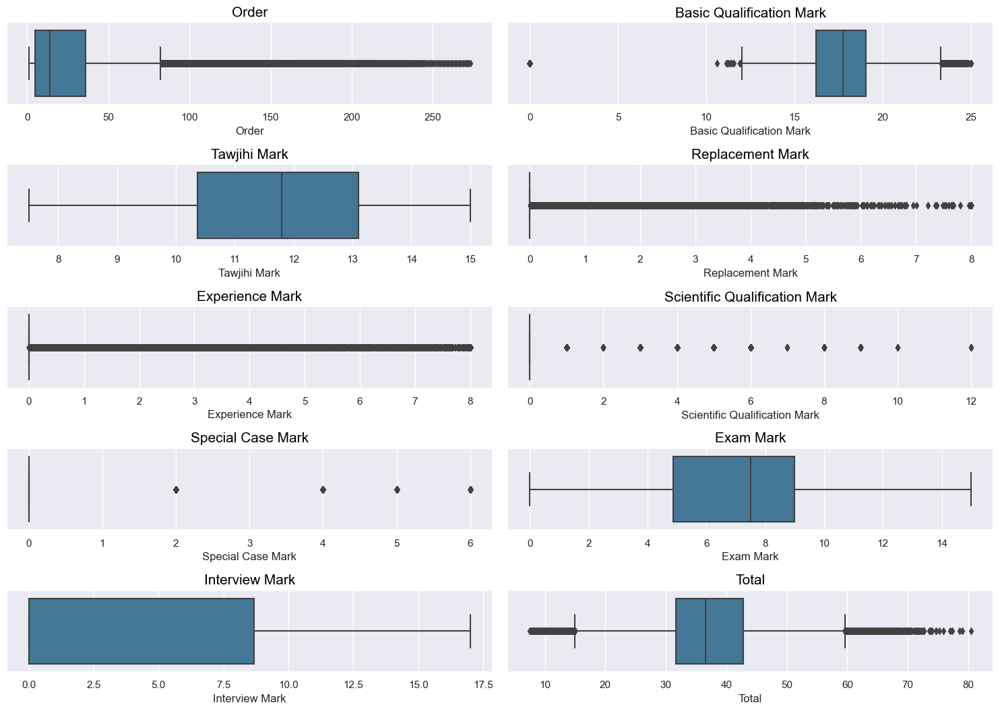

In [26]:
plt.figure(figsize = (15,25))
for idx, i in enumerate(continious_features):
    plt.subplot(12, 2, idx + 1)
    sns.boxplot(x = i, data = df,palette="mako")
    plt.title(i,color='black',fontsize=15)
    plt.xlabel(i, size = 12)
plt.tight_layout()
plt.show()

###### There are many outliers in the following columns: 'Order', 'Basic Qualification Mark', 'Replacement Mark', 'Experience Mark', 'Scientific Qualification Mark', 'Special Case Mark', and 'Total'.

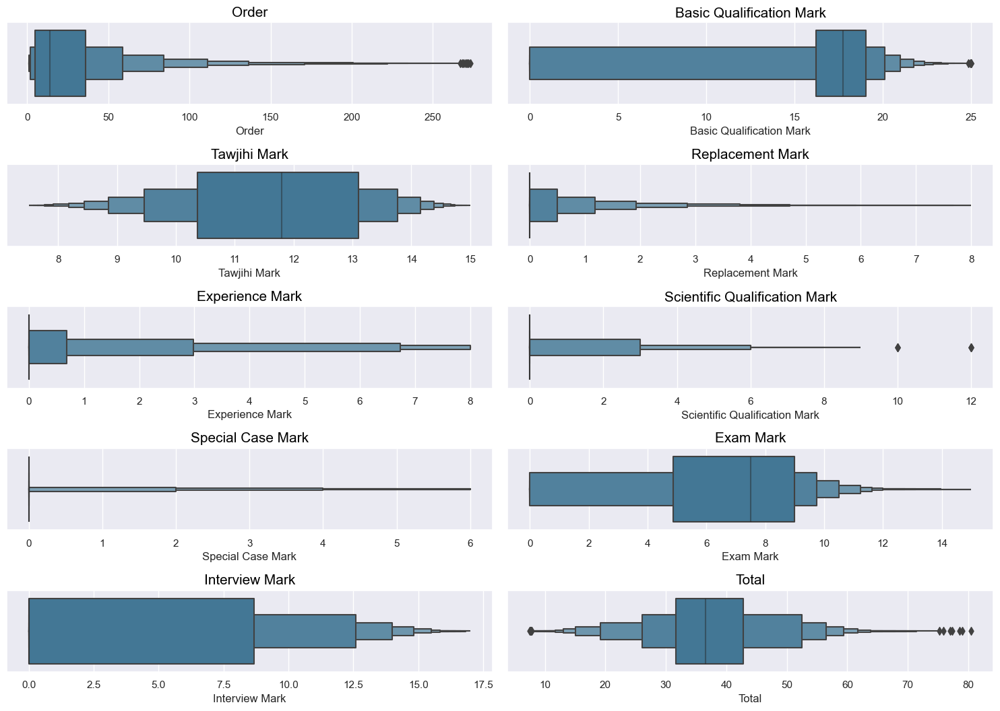

In [27]:
plt.figure(figsize = (15,25))
for idx, i in enumerate(continious_features):
    plt.subplot(12, 2, idx + 1)
    sns.boxenplot(x = i, data = df,palette="mako")
    plt.title(i,color='black',fontsize=15)
    plt.xlabel(i, size = 12)
plt.tight_layout()
plt.show()

### Feature Distributions

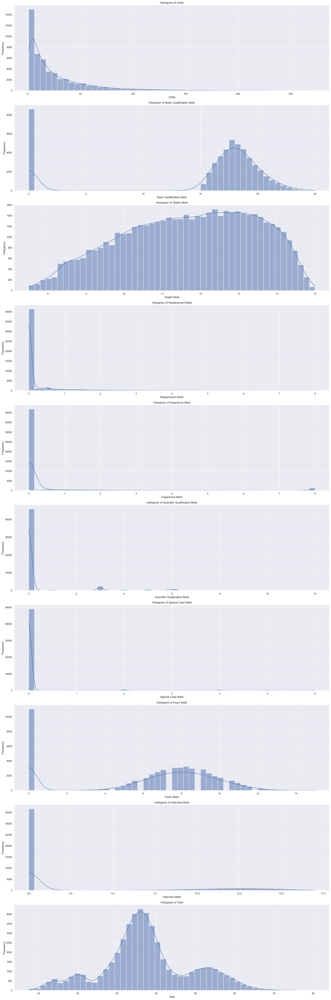

In [28]:
fig, axs = plt.subplots(len(continious_features.columns), 1, figsize=(20, 60))

for i, column in enumerate(continious_features.columns):
    
    sns.histplot(continious_features[column], bins=50, ax=axs[i], kde=True, fill=True)
    axs[i].set_title(f'Histogram of {column}')
    axs[i].set_xlabel(column)
    axs[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

###### There are no normal distributions present, and the high number of zeros in the test scores affects the distributions as well.

### Exploring zeros records

In [29]:
percentage_zero = {}
for column in continious_features.columns:
    
    count_zero = (continious_features[column] == 0).sum()
    
   
    percentage = (count_zero / len(continious_features)) * 100
    
    percentage_zero[column] = percentage


percentage_df = pd.DataFrame(list(percentage_zero.items()), columns=['Feature', 'Percentage of Rows = 0'])

print(percentage_df)

                         Feature  Percentage of Rows = 0
0                          Order                0.000000
1       Basic Qualification Mark               17.231644
2                   Tawjihi Mark                0.000000
3               Replacement Mark               80.962297
4                Experience Mark               83.381054
5  Scientific Qualification Mark               91.974851
6              Special Case Mark               98.123861
7                      Exam Mark               22.173278
8                 Interview Mark               73.287548
9                          Total                0.000000


#### Many test scores almost all of their records—are zeros, such as the following:

Replacement Mark: ***80.962297*** <br>
Experience Mark: ***83.381054*** <br>
Scientific Qualification Mark: ***91.974851*** <br>
Special Case Mark: ***98.123861*** <br>
This represents a very large percentage. I will determine later whether to remove them or not.

### Features Distribution

In [30]:
def check_distribution(data):
    skewness = stats.skew(data)
    _, shapiro_p_value = stats.shapiro(data)

    if shapiro_p_value > 0.05:
        if skewness > 0:
            return "Right-skewed"
        elif skewness < 0:
            return "Left-skewed"
        else:
            return "Normally distributed"
    else:
        return "Not normally distributed"

results = continious_features.apply(check_distribution)

print(results)

Order                            Not normally distributed
Basic Qualification Mark         Not normally distributed
Tawjihi Mark                     Not normally distributed
Replacement Mark                 Not normally distributed
Experience Mark                  Not normally distributed
Scientific Qualification Mark    Not normally distributed
Special Case Mark                Not normally distributed
Exam Mark                        Not normally distributed
Interview Mark                   Not normally distributed
Total                            Not normally distributed
dtype: object


C:\Users\lenovo\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


### Exploring transformations, such as square root or log transformations, to achieve a normal distribution for certain features.

C:\Users\lenovo\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\lenovo\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\lenovo\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\lenovo\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\lenovo\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\lenovo\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountere

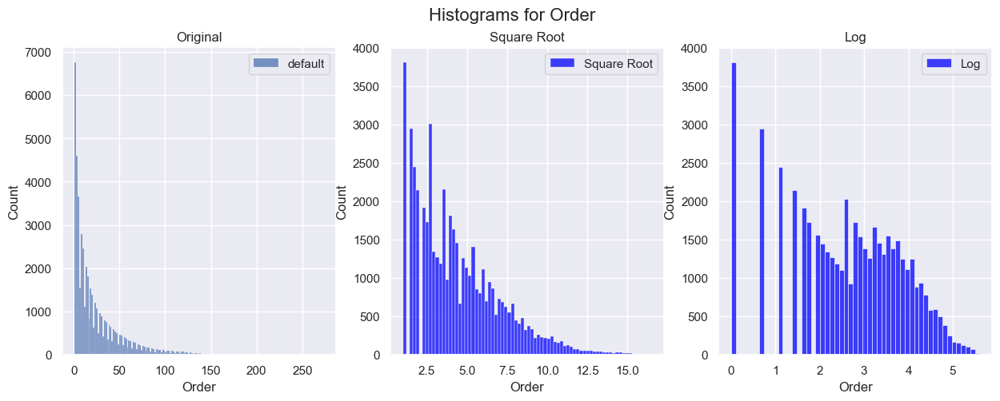

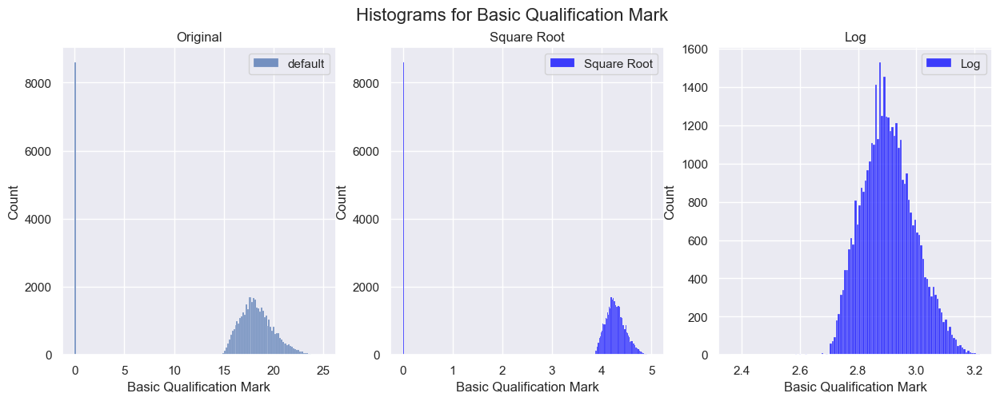

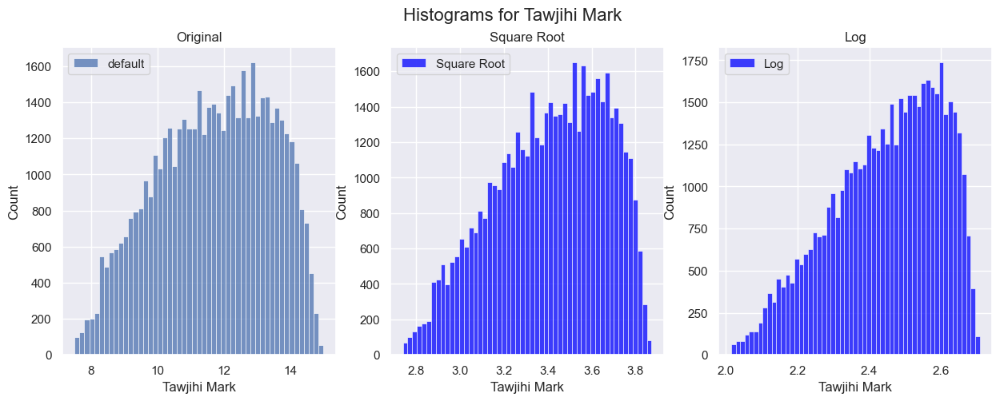

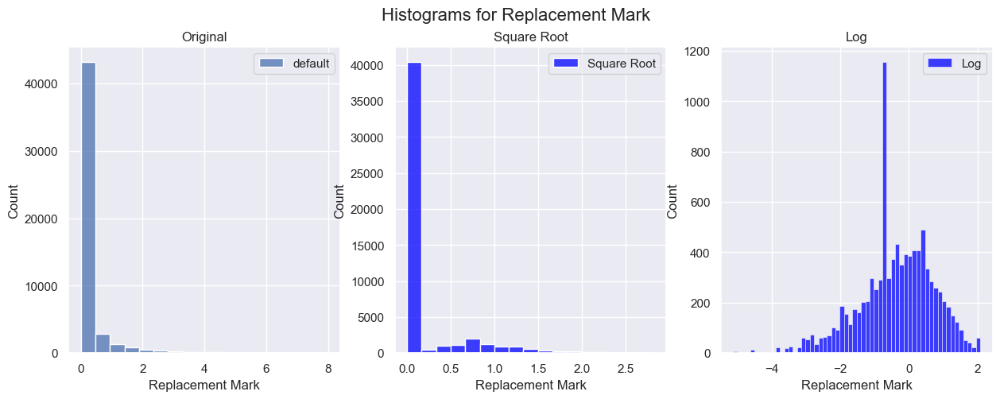

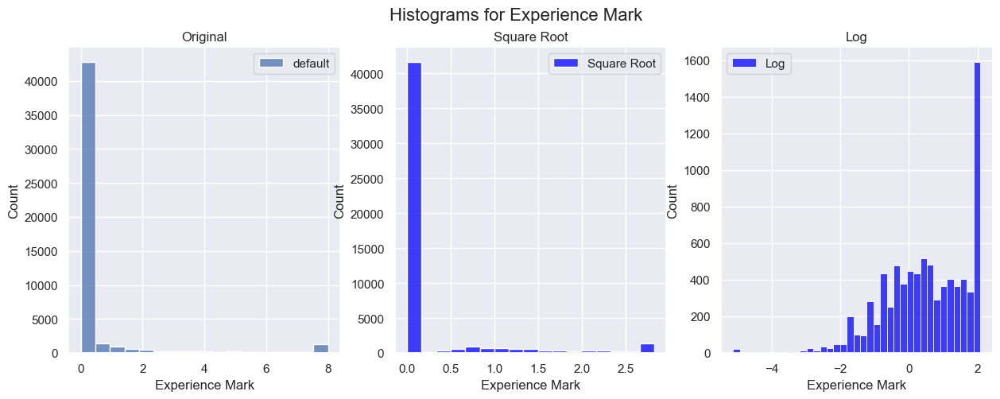

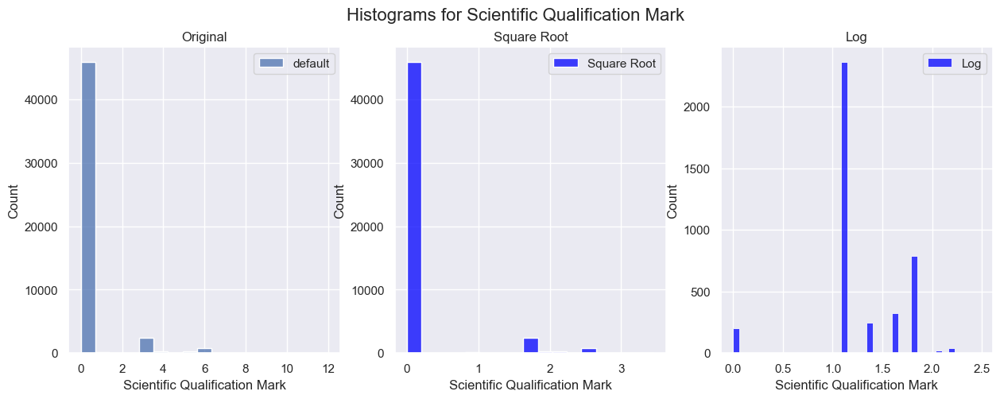

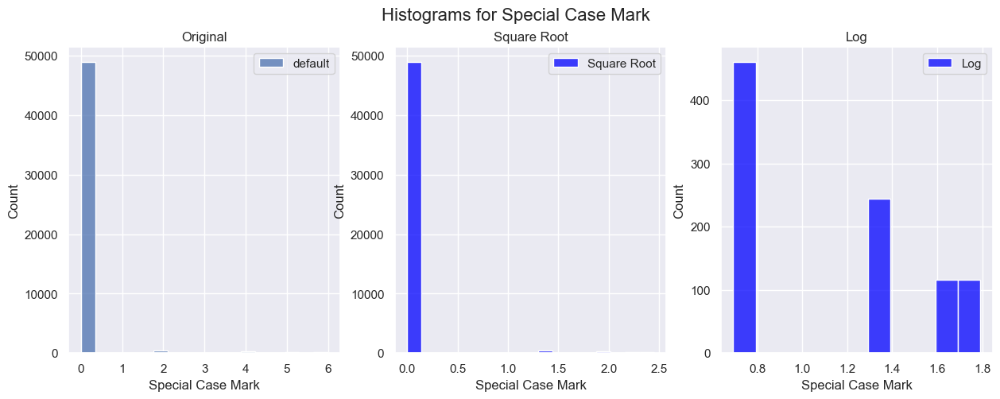

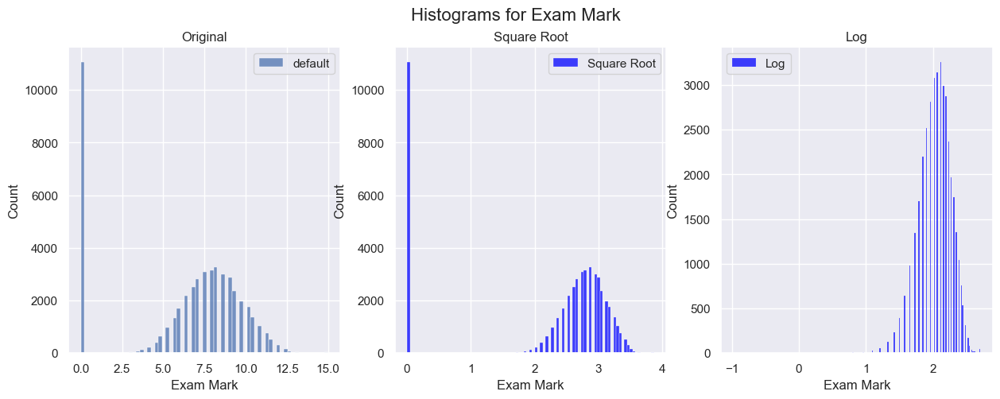

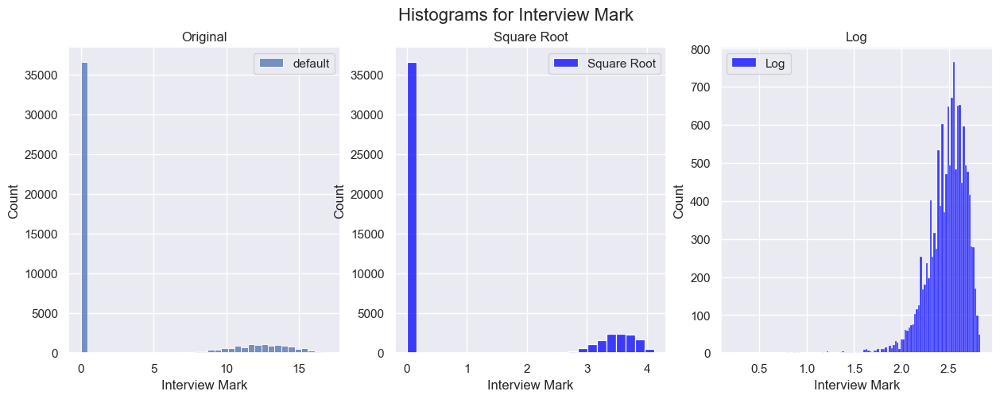

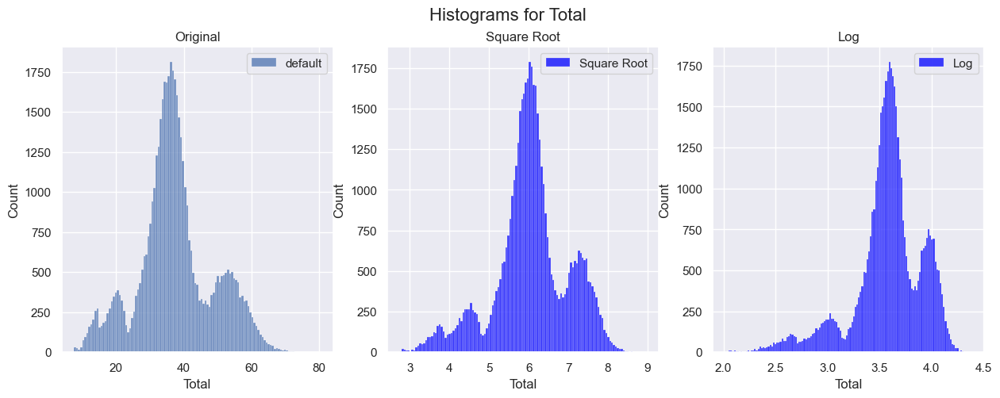

In [31]:
for col in continious_features:
    fig, ax = plt.subplots(1,3,figsize=(15, 5)) 
    fig.suptitle(f"Histograms for {col}", fontsize=16)

    sns.histplot(df[col], ax=ax[0], label='default')
    ax[0].set_title('Original')

    sns.histplot(np.sqrt(df[col]), ax=ax[1], color='blue', label='Square Root')
    ax[1].set_title('Square Root')

    sns.histplot(np.log(df[col]), ax=ax[2], color='blue', label='Log')
    ax[2].set_title('Log')

    for axis in ax:
        axis.legend()

plt.show()

## Observations

### 1. Basic Qualification Mark
- **Observation**: The log transformation normalizes the distribution effectively.
- Will Apply log transformation.

### 2. Total
- **Observation**: Both square root and log transformations normalize the distribution well, but the log transformation seems slightly better.
- Will Apply log transformation.

### 3. Exam Mark
- **Observation**: The original distribution is already fairly normal.
- No transformation needed.

### 4. Special Case Mark
- **Observation**: The log transformation helps to reduce skewness.
- Will Apply log transformation.

### 5. Scientific Qualification Mark
- **Observation**: The log transformation reduces the skewness more effectively.
- Will Apply log transformation.

### 6. Interview Mark
- **Observation**: The original distribution is already normal.
- No transformation needed.

### 7. Experience Mark
- **Observation**: The log transformation handles the skewness better.
- Will Apply log transformation.

### 8. Replacement Mark
- **Observation**: Log transformation seems to normalize the distribution better.
- Will Apply log transformation.

### 9. Tawjihi Mark
- **Observation**: The distribution is relatively normal.
- No transformation needed.

### 10. Order
- **Observation**: The log transformation significantly reduces skewness.
- Will Apply log transformation.

### Top administrative units with the highest number of teachers.

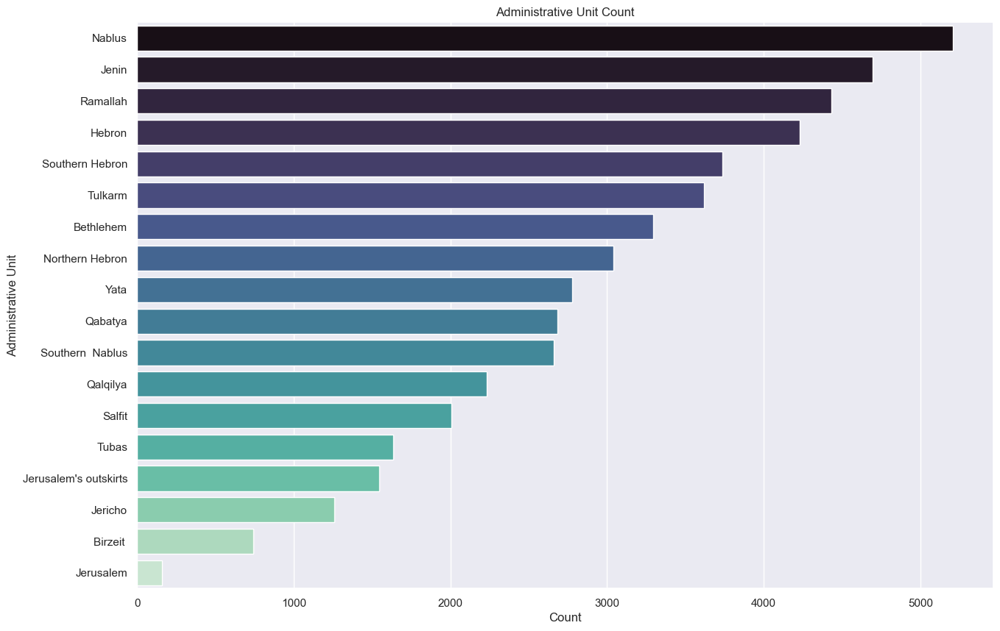

In [32]:
unit_counts = df['Administrative Unit'].value_counts()
top_units = unit_counts
plt.figure(figsize=(15, 10))
sns.countplot(y='Administrative Unit', data=df[df['Administrative Unit'].isin(top_units.index)], order=top_units.index,palette='mako')
plt.title('Administrative Unit Count')
plt.xlabel('Count')
plt.ylabel('Administrative Unit')
plt.show()

##### Nablus is the administrative unit with the highest number of teachers, while Jerusalem has the lowest.

### Males vs Females

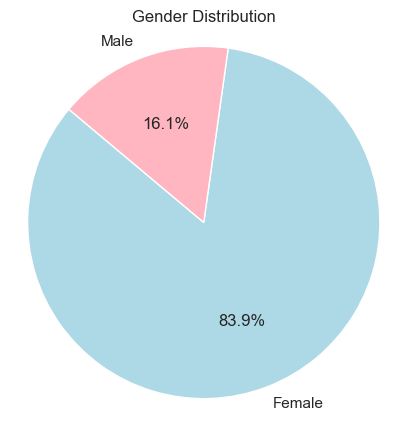

In [33]:
gender_counts = df['Gender'].value_counts()

plt.figure(figsize=(5, 5))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%',
        startangle=140, colors=['lightblue', 'lightpink', 'lightgreen'])

plt.axis('equal')  
plt.title('Gender Distribution')
plt.show()

##### Females significantly outnumber males, comprising 84% of the entire dataset, while males account for only 16%.

### Top exam materials with the highest number of records or teachers.

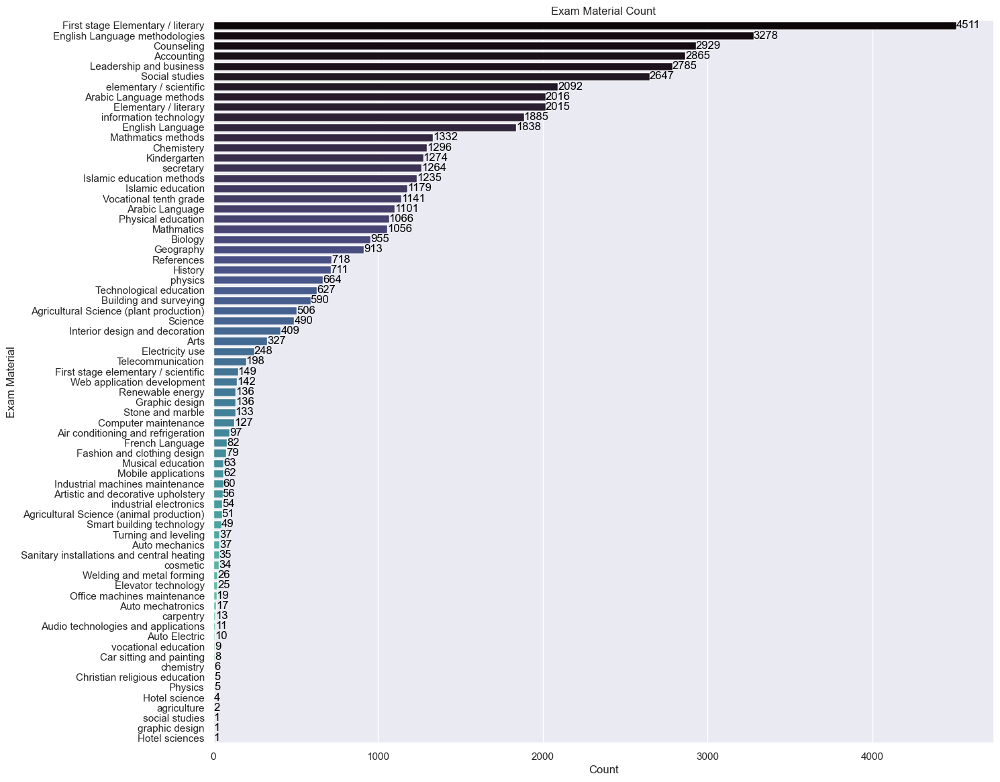

In [34]:
unit_counts = df['Exam Material'].value_counts()
top_units = unit_counts

plt.figure(figsize=(15, 14))
ax = sns.countplot(
    y='Exam Material',
    data=df[df['Exam Material'].isin(top_units.index)],
    order=top_units.index,
    palette='mako'
)


for i, count in enumerate(top_units):
    ax.text(count, i, str(count), va='center', ha='left', color='black')

plt.title('Exam Material Count')
plt.xlabel('Count')
plt.ylabel('Exam Material')
plt.show()

##### The most studied exam material is "First Stage Elementary/Literacy," with 4,511 records. In contrast, Graphic Design, Social Studies, and Hotel sciences are the least studied, each with only one record.

### Exploring Target Classes

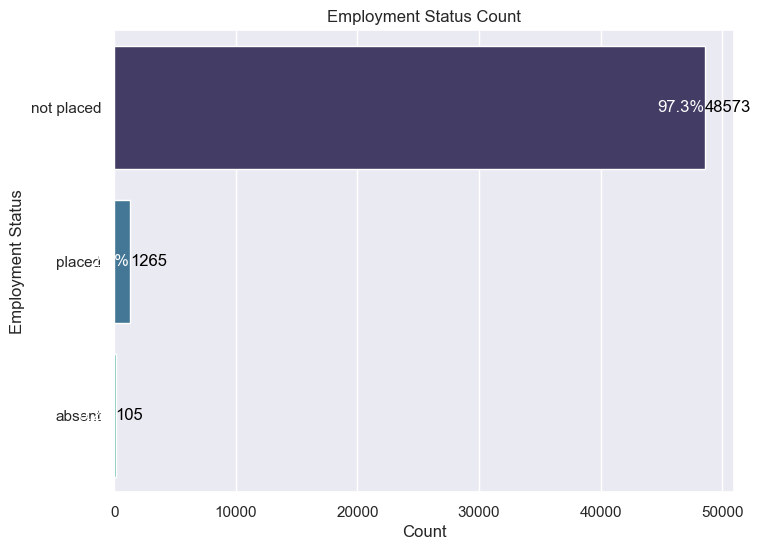

In [35]:
unit_counts = df['Employment Status'].value_counts()
top_units = unit_counts

plt.figure(figsize=(8, 6))
ax = sns.countplot(
    y='Employment Status',
    data=df[df['Employment Status'].isin(top_units.index)],
    order=top_units.index,
    palette='mako'
)


for i, count in enumerate(top_units):
    ax.text(count + 5, i, f"{(count / df.shape[0]) * 100:.1f}%", va='center', ha='right', color='white')
    
    ax.text(count, i, str(count), va='center', ha='left', color='black')

plt.title('Employment Status Count')
plt.xlabel('Count')
plt.ylabel('Employment Status')
plt.show()

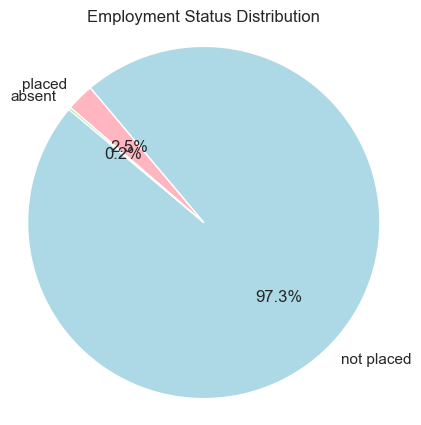

In [36]:
gender_counts = df['Employment Status'].value_counts()

plt.figure(figsize=(5, 5))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%',
        startangle=140, colors=['lightblue', 'lightpink', 'lightgreen'])

plt.axis('equal')  
plt.title('Employment Status Distribution')
plt.show()

##### Over 97% of the teachers are unplaced. <br> 
##### The target classes are not balanced; I will address this later.

### Exploring Employment Reason

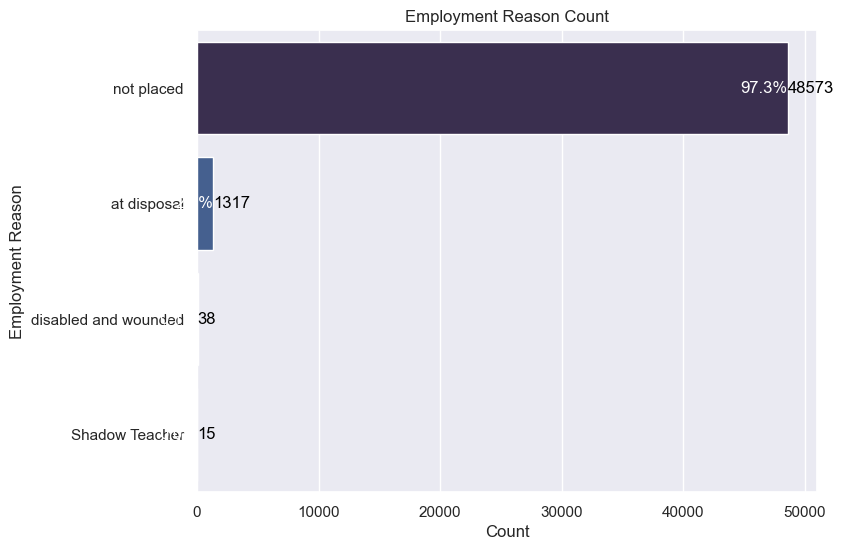

In [37]:
unit_counts = df['Employment Reason'].value_counts()
top_units = unit_counts

plt.figure(figsize=(8, 6))
ax = sns.countplot(
    y='Employment Reason',
    data=df[df['Employment Reason'].isin(top_units.index)],
    order=top_units.index,
    palette='mako'
)

for i, count in enumerate(top_units):
    
    ax.text(count + 5, i, f"{(count / df.shape[0]) * 100:.1f}%", va='center', ha='right', color='white')
    
    ax.text(count, i, str(count), va='center', ha='left', color='black')

plt.title('Employment Reason Count')
plt.xlabel('Count')
plt.ylabel('Employment Reason')
plt.show()


##### Over 97% of the teachers are taking the exam because they have not been placed.

### Top college degrees with the highest number ofteachers.

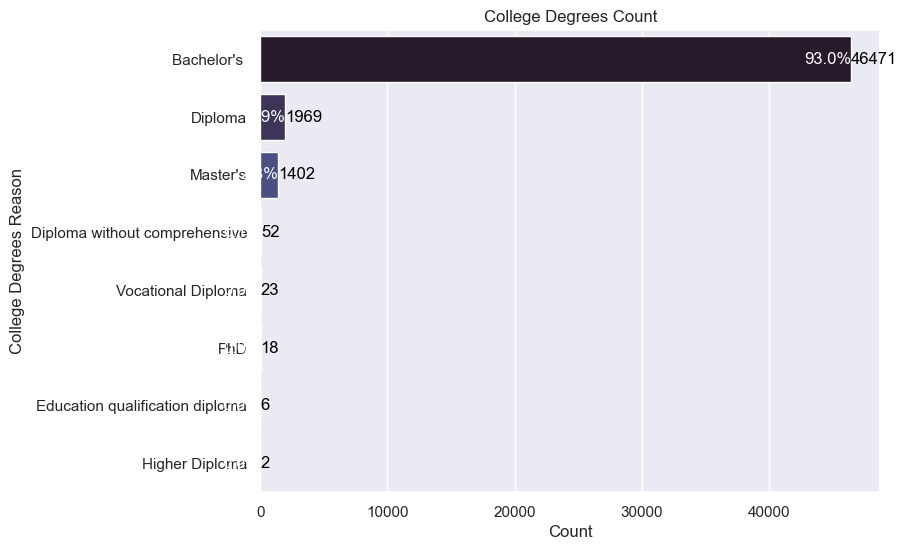

In [38]:
unit_counts = df['College Degrees'].value_counts()
top_units = unit_counts

plt.figure(figsize=(8, 6))
ax = sns.countplot(
    y='College Degrees',
    data=df[df['College Degrees'].isin(top_units.index)],
    order=top_units.index,
    palette='mako'
)

for i, count in enumerate(top_units):
    
    ax.text(count + 5, i, f"{(count / df.shape[0]) * 100:.1f}%", va='center', ha='right', color='white')
    
    ax.text(count, i, str(count), va='center', ha='left', color='black')

plt.title('College Degrees Count')
plt.xlabel('Count')
plt.ylabel('College Degrees Reason')
plt.show()


##### Over 93% of the dataset holds a bachelor’s degree as their educational level.

# Bivariate Exploration

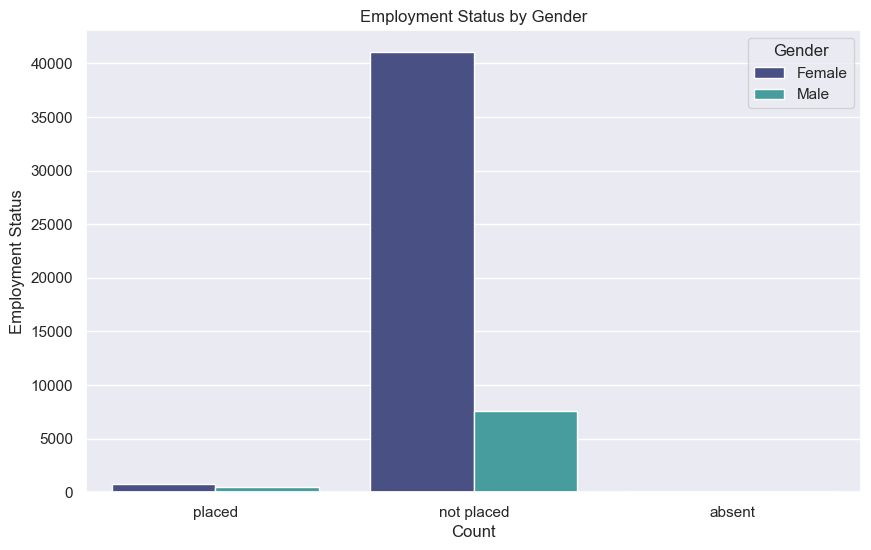

In [39]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Employment Status', hue='Gender', palette='mako')

plt.title('Employment Status by Gender')
plt.xlabel('Count')
plt.ylabel('Employment Status')
plt.legend(title='Gender')
plt.show()

###### Not place females are way more than not placed males

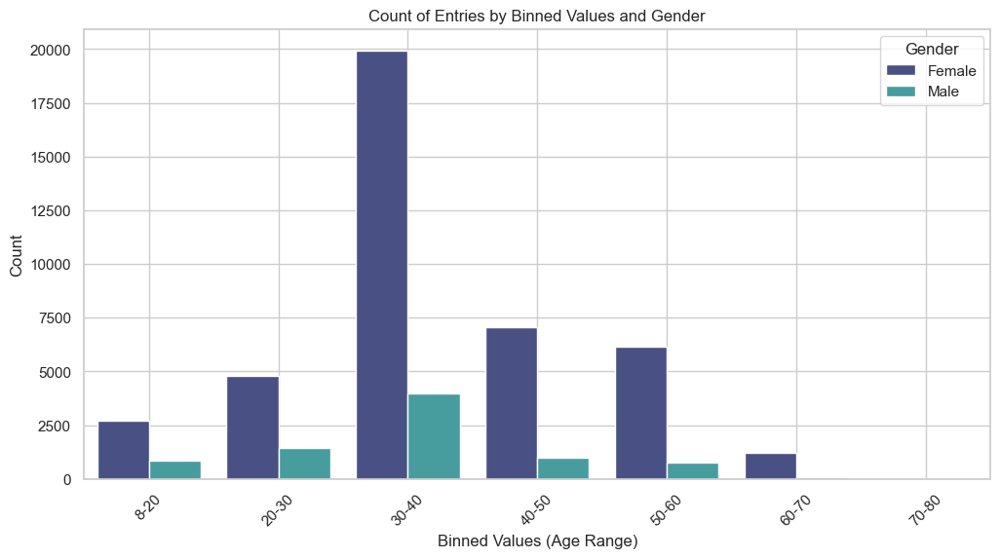

In [40]:
bins = [8, 20, 30, 40, 50, 60, 70, 80]
labels = [f"{bins[i]}-{bins[i+1]}" for i in range(len(bins)-1)]

df['Binned Values'] = pd.cut(df['Total'], bins=bins, labels=labels, right=False)


sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Binned Values', hue='Gender', palette='mako')
plt.title('Count of Entries by Binned Values and Gender')
plt.xlabel('Binned Values (Age Range)')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.grid(True)
plt.show()

##### Most people score between 30 and 40, with females outnumbering males in every one.

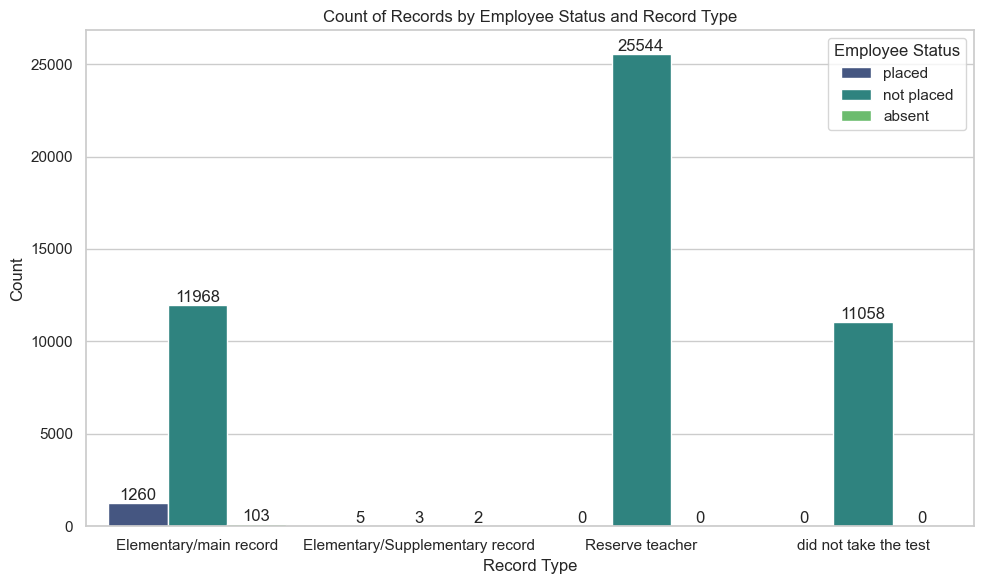

In [41]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='Record Type', hue='Employment Status', palette='viridis')


for container in ax.containers:
    ax.bar_label(container, fmt='%d') 


plt.title('Count of Records by Employee Status and Record Type')
plt.xlabel('Record Type')
plt.ylabel('Count')
plt.legend(title='Employee Status')

plt.tight_layout()
plt.show()

##### All placed teachers have taken the tests, there are no placed teachers who skipped them.

### Employment Status vs Total scores

In [42]:
fig = px.box(df, x='Employment Status', y='Total', color='Employment Status',
             title='Distribution of Total Scores by Employment Status',
             labels={'Employment Status': 'Employment Status', 'Total': 'Total Scores'},
             color_discrete_sequence=px.colors.qualitative.Vivid)


fig.show()

### Administrative Unit vs Total

In [43]:

fig = px.box(df, x='Administrative Unit', y='Total', title='Box Plot of Total by Administrative Unit')


fig.show()

### Exam Material vs Total

In [44]:

fig = px.box(df, x='Exam Material', y='Total', title='Box Plot of Total by Administrative Unit')


fig.show()

In [45]:
exam_material_counts = df.groupby(['Employment Status', 'Exam Material']).size().reset_index(name='Count')


fig = px.bar(exam_material_counts, 
             x='Exam Material', 
             y='Count', 
             color='Employment Status',
             barmode='group',
             title='Count of Exam Material by Employment Status',
             labels={'Exam Material': 'Exam Material', 'Count': 'Count'},
             color_discrete_sequence=px.colors.qualitative.Vivid)


fig.show()

### Total marks vs Order Line Plot

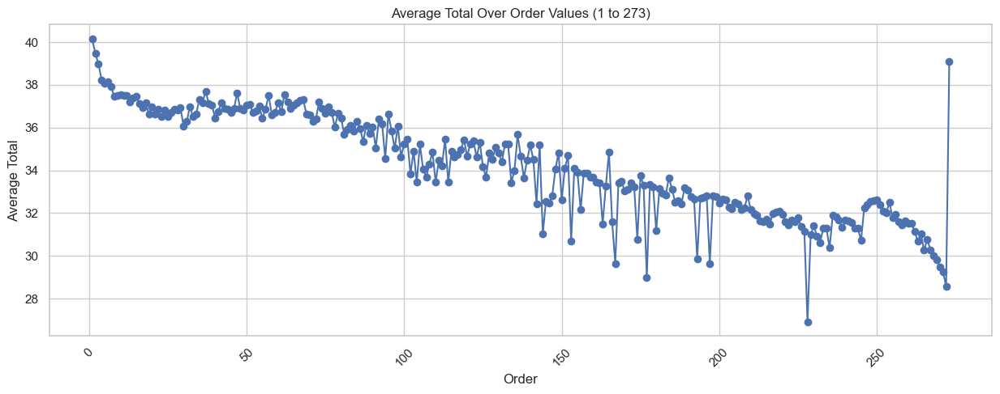

In [46]:
df_sorted = df.sort_values(by='Order')


avg_total_by_order = df_sorted.groupby('Order')['Total'].mean()


plt.figure(figsize=(15, 5))
plt.plot(avg_total_by_order.index, avg_total_by_order.values, marker='o', linestyle='-')
plt.title('Average Total Over Order Values (1 to 273)')
plt.xlabel('Order')
plt.ylabel('Average Total')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

##### Total decrease by increasing the order number

### Test scores vs each other

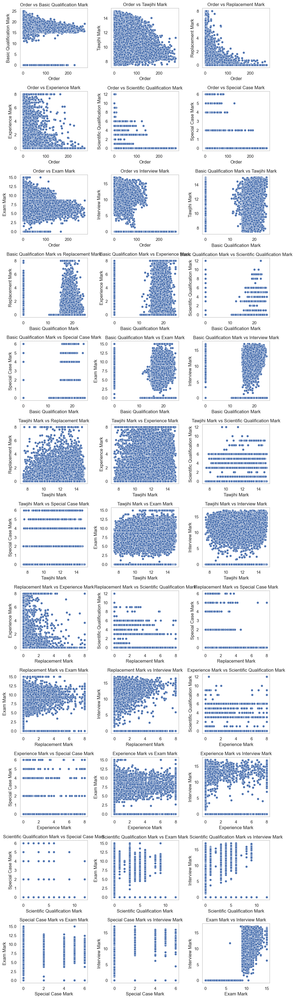

In [47]:
features = [
    'Order','Basic Qualification Mark', 'Tawjihi Mark', 'Replacement Mark',
    'Experience Mark', 'Scientific Qualification Mark',
    'Special Case Mark', 'Exam Mark', 'Interview Mark'
]


num_features = len(features)


num_rows = (num_features * (num_features - 1)) // 2 // 3 + 1  


fig, axes = plt.subplots(num_rows, 3, figsize=(10, num_rows * 3))  
axes = axes.flatten() 

plot_index = 0


for i in range(num_features):
    for j in range(i + 1, num_features):
        if plot_index < len(axes): 
            sns.scatterplot(x=df[features[i]], y=df[features[j]], ax=axes[plot_index])
            axes[plot_index].set_title(f'{features[i]} vs {features[j]}')
            axes[plot_index].set_xlabel(features[i])
            axes[plot_index].set_ylabel(features[j])
            axes[plot_index].grid()
            plot_index += 1


for ax in axes[plot_index:]:
    fig.delaxes(ax)

plt.tight_layout() 
plt.show()

- ##### Order has a subtle negative correlation with the scores of the other exam marks, indicating that teachers with a high order have lower scores.<br>
- ##### There is a slight negative correlation between the Experience Mark and the Replacement Mark.<br>
- ##### A positive correlation exists between the Replacement Mark and the Interview Mark.<br>
- ##### There is also a positive correlation between the Scientific Qualification Mark and the Interview Mark.<br>
- ##### Additionally, there is a positive correlation between the Exam Mark and the Interview Questions.<br>

### Now lets examine correlation between our target 'Total' and rest scores

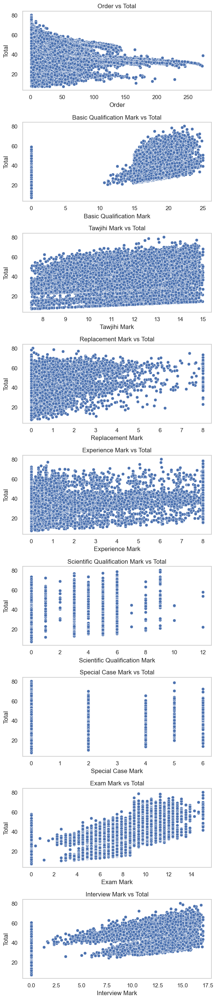

In [48]:
features = [
    'Order', 'Basic Qualification Mark', 'Tawjihi Mark', 'Replacement Mark',
    'Experience Mark', 'Scientific Qualification Mark',
    'Special Case Mark', 'Exam Mark', 'Interview Mark'
]


num_features = len(features)  


fig, axes = plt.subplots(num_features, 1, figsize=(6, num_features * 3)) 
axes = axes.flatten()


for plot_index, feature in enumerate(features): 
    sns.scatterplot(x=df[feature], y=df['Total'], ax=axes[plot_index])
    axes[plot_index].set_title(f'{feature} vs Total')
    axes[plot_index].set_xlabel(feature)
    axes[plot_index].set_ylabel('Total')
    axes[plot_index].grid()

plt.tight_layout()  
plt.show()

- ##### The Exam Mark, Interview Mark, and Basic Qualification Mark have a positive correlation with our target output.<br>
- ##### The Replacement Mark and Experience Mark show a subtle positive correlation with the total.<br>
- ##### In contrast, the Order has a subtle negative correlation with the total.<br>

### Lets examine correlation in details

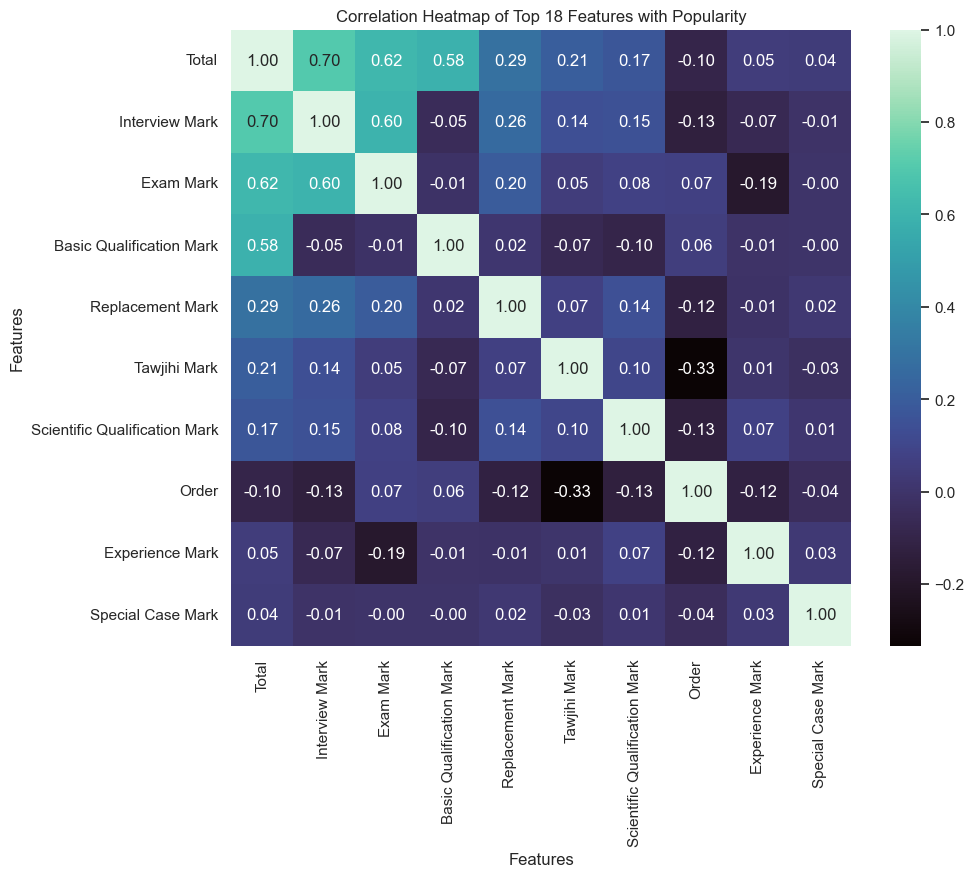

In [49]:
excluded_columns = categorical_features


X_correlation = df.drop(excluded_columns, axis=1)
y = df['Total']


numerical_features = X_correlation.select_dtypes(include=['int64', 'float64'])
categorical_features = X_correlation.select_dtypes(exclude=['int64', 'float64'])

numerical_correlations = numerical_features.corrwith(y)

sorted_correlations = numerical_correlations.abs().sort_values(ascending=False)
top_n_features = 18
top_features = sorted_correlations.index[:top_n_features]

top_feature_corr = X_correlation[top_features].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(top_feature_corr, annot=True, cmap='mako', fmt=".2f")
plt.title(f"Correlation Heatmap of Top {top_n_features} Features with Popularity")
plt.xlabel("Features")
plt.ylabel("Features")
plt.show()


C:\Users\lenovo\AppData\Local\Temp\ipykernel_1764\2483778367.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



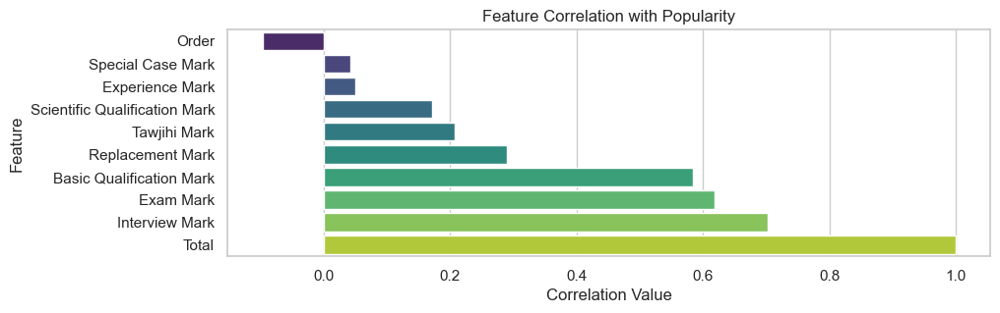

In [50]:
non_object_cols = df.select_dtypes(exclude=['object']).columns
correlation_series = df[non_object_cols].corr()["Total"]

correlation_df = pd.DataFrame(correlation_series.items(), columns=['Feature', 'Correlation'])

correlation_df = correlation_df.sort_values(by='Correlation')


plt.figure(figsize=(10, 3))
sns.barplot(x='Correlation', y='Feature', data=correlation_df, palette='viridis')

plt.title('Feature Correlation with Popularity')
plt.xlabel('Correlation Value')
plt.ylabel('Feature')

plt.show()

##### The Special Case Mark has a very low correlation with the total.

## **EDA main findings and conclusion**

### The features are highly imbalanced across nearly every class or feature.

# Feature Engineering

In [51]:
df.head()

,Administrative Unit,Gender,Exam Material,Record Type,Order,Employment Status,Employment Reason,College Degrees,Basic Qualification Mark,Tawjihi Mark,Replacement Mark,Experience Mark,Scientific Qualification Mark,Special Case Mark,Exam Mark,Interview Mark,Total,Binned Values
0,Birzeit,Female,First stage elementary / scientific,Elementary/main record,1,placed,at disposal,Bachelor's,17.44,10.41,0.456,0.000,0,0,9.375,8.667,46.35,40-50
1,Birzeit,Male,Islamic education methods,Elementary/main record,1,placed,at disposal,Bachelor's,17.70,9.64,2.600,0.000,0,0,9.000,9.500,48.44,40-50
2,Birzeit,Female,English Language,Elementary/main record,2,placed,at disposal,Bachelor's,23.55,13.11,1.178,0.000,0,0,10.125,9.917,57.88,50-60
3,Birzeit,Female,Elementary / literary,Elementary/main record,1,placed,at disposal,Bachelor's,19.32,14.58,0.000,2.539,3,0,11.250,13.916,64.60,60-70
4,Birzeit,Female,English Language methodologies,Elementary/main record,1,placed,at disposal,Bachelor's,19.71,13.89,2.678,0.000,3,0,9.000,14.833,63.11,60-70


In [52]:
df['Calculated Total'] = (df['Basic Qualification Mark'] +
                          df['Tawjihi Mark'] +
                          df['Replacement Mark'] +
                          df['Experience Mark'] +
                          df['Scientific Qualification Mark'] +
                          df['Special Case Mark'] +
                          df['Exam Mark'] +
                          df['Interview Mark'])

df['Calculated Total'] = df['Calculated Total'].round(2)
rows_not_matching_total = df[df['Calculated Total'] != df['Total']]

rows_not_matching_total

,Administrative Unit,Gender,Exam Material,Record Type,Order,Employment Status,Employment Reason,College Degrees,Basic Qualification Mark,Tawjihi Mark,Replacement Mark,Experience Mark,Scientific Qualification Mark,Special Case Mark,Exam Mark,Interview Mark,Total,Binned Values,Calculated Total
21,Jericho,Female,Arabic Language methods,Elementary/main record,7,not placed,not placed,Bachelor's,17.18,11.97,0.700,0.000,0,0,9.375,15.050,54.28,50-60,54.27
559,Salfit,Female,English Language,Elementary/main record,14,not placed,not placed,Bachelor's,0.00,14.30,0.000,0.000,0,0,10.125,11.330,35.75,30-40,35.76
787,Salfit,Female,elementary / scientific,Elementary/main record,21,not placed,not placed,Bachelor's,18.84,11.62,0.489,0.000,0,0,9.000,13.666,53.62,50-60,53.61
1118,Salfit,Female,Social studies,Elementary/main record,27,not placed,not placed,Bachelor's,17.56,11.79,0.000,0.000,0,0,10.125,11.160,50.64,50-60,50.63
1383,Salfit,Female,Islamic education,Elementary/main record,14,not placed,not placed,Bachelor's,0.00,11.30,0.000,0.000,0,0,9.375,7.670,28.35,20-30,28.34
1410,Salfit,Female,Islamic education methods,Elementary/main record,17,not placed,not placed,Bachelor's,19.76,10.64,0.000,0.000,0,0,9.375,6.170,45.94,40-50,45.95
1474,Salfit,Female,English Language,Elementary/main record,13,not placed,not placed,Bachelor's,0.00,14.19,0.717,0.000,0,0,9.375,12.333,36.61,30-40,36.62
3880,Birzeit,Female,Mathmatics methods,Elementary/main record,5,not placed,not placed,Bachelor's,0.00,13.16,0.000,0.000,0,0,11.625,10.830,35.61,30-40,35.62
4539,Hebron,Female,Mathmatics,Elementary/main record,1,placed,at disposal,Master's,20.75,14.01,2.978,0.700,9,0,10.500,15.917,73.85,70-80,73.86
5681,Nablus,Female,English Language methodologies,Elementary/main record,60,not placed,not placed,Bachelor's,0.00,10.01,0.022,0.000,3,0,10.500,11.083,34.61,30-40,34.62


In [53]:
df.drop(['Binned Values','Calculated Total'], axis=1, inplace=True)
df.reset_index(drop=True, inplace=True)

# Outliers Handling

In [54]:
def find_outliers(df):

  q1=df.quantile(0.25)

  q3=df.quantile(0.75)

  IQR=q3-q1

  outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

  return outliers

In [55]:
def find_extreme_outliers(df):

  q1=df.quantile(0.25)

  q3=df.quantile(0.75)

  IQR=q3-q1

  outliers = df[((df<(q1-3*IQR)) | (df>(q3+3*IQR)))]

  return outliers

#### Find Outliers

In [56]:
for col in continious_features.columns:
    outliers=find_outliers(df[col])
    print("Number of outliers in",col,":", str(len(outliers)),",it's Percentage is : ",str(len(outliers)*100/len(df)),"%")
    print("\n")

Number of outliers in Order : 3219 ,it's Percentage is :  6.445347696373866 %


Number of outliers in Basic Qualification Mark : 8815 ,it's Percentage is :  17.650121138097433 %


Number of outliers in Tawjihi Mark : 0 ,it's Percentage is :  0.0 %


Number of outliers in Replacement Mark : 9508 ,it's Percentage is :  19.037702981398795 %


Number of outliers in Experience Mark : 8300 ,it's Percentage is :  16.6189455979817 %


Number of outliers in Scientific Qualification Mark : 4008 ,it's Percentage is :  8.025148669483212 %


Number of outliers in Special Case Mark : 937 ,it's Percentage is :  1.8761387982299822 %


Number of outliers in Exam Mark : 0 ,it's Percentage is :  0.0 %


Number of outliers in Interview Mark : 0 ,it's Percentage is :  0.0 %


Number of outliers in Total : 3003 ,it's Percentage is :  6.012854654305909 %




#### Find Extreme Outliers

In [57]:
for col in continious_features.columns:
    outliers=find_extreme_outliers(df[col])
    print("Number of outliers in",col,":", str(len(outliers)),",it's Percentage is : ",str(len(outliers)*100/len(df)),"%")
    print("\n")

Number of outliers in Order : 936 ,it's Percentage is :  1.8741365156278158 %


Number of outliers in Basic Qualification Mark : 8606 ,it's Percentage is :  17.231644074244638 %


Number of outliers in Tawjihi Mark : 0 ,it's Percentage is :  0.0 %


Number of outliers in Replacement Mark : 9508 ,it's Percentage is :  19.037702981398795 %


Number of outliers in Experience Mark : 8300 ,it's Percentage is :  16.6189455979817 %


Number of outliers in Scientific Qualification Mark : 4008 ,it's Percentage is :  8.025148669483212 %


Number of outliers in Special Case Mark : 937 ,it's Percentage is :  1.8761387982299822 %


Number of outliers in Exam Mark : 0 ,it's Percentage is :  0.0 %


Number of outliers in Interview Mark : 0 ,it's Percentage is :  0.0 %


Number of outliers in Total : 5 ,it's Percentage is :  0.01001141301083235 %




##### Outliers Removal

In [58]:
def remove_outlier(col):

  sorted(col)
  Q1,Q3=col.quantile([0.25,0.75])
  IQR=Q3-Q1
  lower_bound=Q1-(3*IQR)
  upper_bound=Q3+(3*IQR)
  return lower_bound,upper_bound

7.729999999999993 27.540000000000006


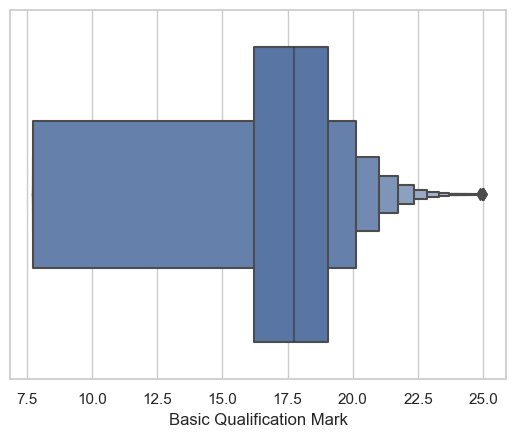

In [59]:
out_columns =['Basic Qualification Mark']

for col in out_columns :
  lower_bound,upper_bound=remove_outlier(df[col])
  df[col]=np.where(df[col]<lower_bound,lower_bound,df[col])
  df[col]=np.where(df[col]>upper_bound,upper_bound,df[col])
  print(lower_bound,upper_bound)
  sns.boxenplot(x=df[col])
  plt.show()

# Feature Transformation

Features to be transformed with ***log*** transformation: **Basic Qualification Mark** , **Total**, **Special Case Mark**, **Scientific Qualification Mark**, **Experience Mark**, **Replacement Mark, Order**.

In [60]:
features_to_log_transform = [
    'Basic Qualification Mark',
    'Total',
    'Special Case Mark',
    'Scientific Qualification Mark',
    'Experience Mark',
    'Replacement Mark',
    'Order'
]

for feature in features_to_log_transform:
    df[feature] = np.log1p(df[feature])

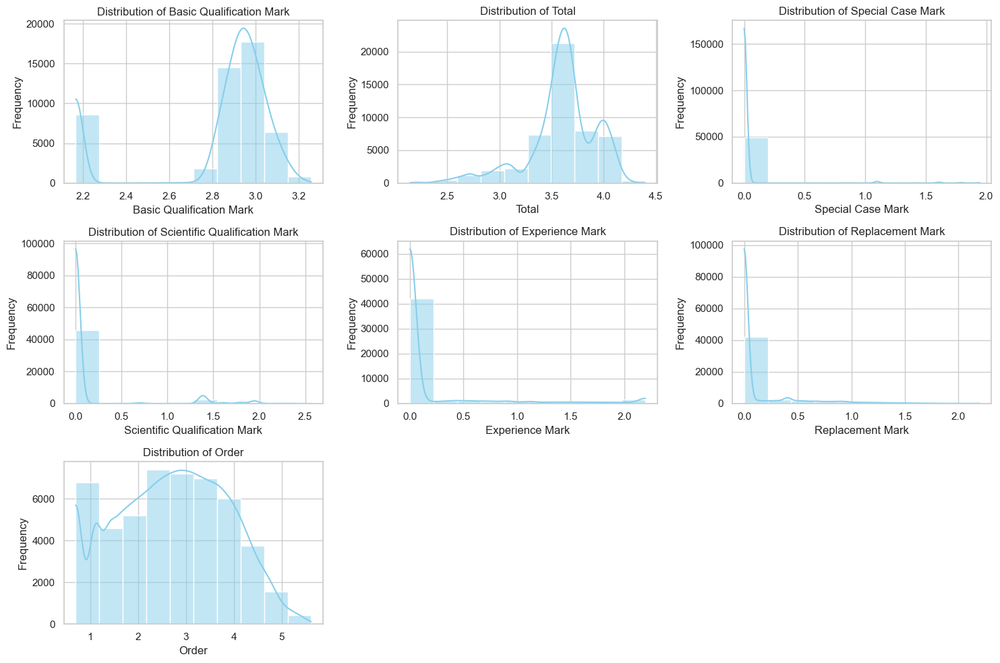

In [61]:
plt.figure(figsize=(15, 10))


for i, feature in enumerate(features_to_log_transform):
    plt.subplot(3, 3, i + 1)  
    sns.histplot(df[feature], kde=True, bins=10, color='skyblue')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### Creating new Features

In [62]:
def ispass(row):
    if row['Total'] >= 50:
        return 1
    else:
        return 0


df['isPassed'] = df.apply(ispass, axis=1)

## Data Splitting

In [63]:
X_feature=df.drop(['Employment Status'],axis=1)
Y_feature=df['Employment Status']
X_train, X_test, y_train, y_test = train_test_split(X_feature, Y_feature, test_size = 0.30,shuffle=True,random_state=10)

## Encoding

### Encoded college degrees using ordinal encoding, as there is a meaningful order among the categories: <br><br>Vocational Diploma < Diploma < Bachelor's < Master's < Higher Diploma < PhD.

In [64]:
education_order = [
    'Vocational Diploma', 'Diploma', 
    'Diploma without comprehensive', 'Education qualification diploma', 
    "Bachelor's ", "Master's", 'Higher Diploma', 'PhD'
]

encoder = OrdinalEncoder(categories=[education_order])
X_train['College Degrees_encoded'] = encoder.fit_transform(X_train[['College Degrees']]).astype(int)
X_test['College Degrees_encoded'] = encoder.transform(X_test[['College Degrees']]).astype(int)

X_train = X_train.drop(columns=['College Degrees'])
X_test = X_test.drop(columns=['College Degrees'])

### Encoded Gender, Employment Reason and Record Type using one-hot encoding

In [65]:
X_train = pd.get_dummies(X_train, columns=['Gender'])
X_test = pd.get_dummies(X_test, columns=['Gender'])

X_train = pd.get_dummies(X_train, columns=['Record Type'])
X_test = pd.get_dummies(X_test, columns=['Record Type'])

X_train = pd.get_dummies(X_train, columns=['Employment Reason'])
X_test = pd.get_dummies(X_test, columns=['Employment Reason'])


X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

### Encoded employment status (target) using label encoding.

In [66]:
encoding = {
    'placed': 0,
    'not placed': 1,
    'absent': 2
}


y_train_encoded = y_train.map(encoding)
y_test_encoded = y_test.map(encoding)

y_train = y_train_encoded
y_test = y_test_encoded

### Encoded administrative units and exam materials using target encoding due to the high number of values, as one-hot encoding would be inefficient and create too many new columns.

In [67]:
y_train_series = pd.Series(y_train, name="target")

X_train_with_target = pd.concat([X_train, y_train_series], axis=1)

admin_unit_means = X_train_with_target.groupby('Administrative Unit')['target'].mean()
X_train['Admin_Unit_Encoded'] = X_train['Administrative Unit'].map(admin_unit_means)
X_test['Admin_Unit_Encoded'] = X_test['Administrative Unit'].map(admin_unit_means).fillna(admin_unit_means.mean())

exam_material_means = X_train_with_target.groupby('Exam Material')['target'].mean()
X_train['Exam_Material_Encoded'] = X_train['Exam Material'].map(exam_material_means)
X_test['Exam_Material_Encoded'] = X_test['Exam Material'].map(exam_material_means).fillna(exam_material_means.mean())

X_train = X_train.drop(columns=['Administrative Unit', 'Exam Material'])
X_test = X_test.drop(columns=['Administrative Unit', 'Exam Material'])

In [68]:
X_train.head()

,Order,Basic Qualification Mark,Tawjihi Mark,Replacement Mark,Experience Mark,Scientific Qualification Mark,Special Case Mark,Exam Mark,Interview Mark,Total,isPassed,College Degrees_encoded,Gender_Female,Gender_Male,Record Type_Elementary/Supplementary record,Record Type_Elementary/main record,Record Type_Reserve teacher,Record Type_did not take the test,Employment Reason_Shadow Teacher,Employment Reason_at disposal,Employment Reason_disabled and wounded,Employment Reason_not placed,Admin_Unit_Encoded,Exam_Material_Encoded
3022,2.484907,2.939162,11.67,0.405465,2.197225,0.00000,0.0,10.125,14.0,4.146304,0,4,1,0,0,1,0,0,0,0,0,1,0.978769,0.968421
38520,4.442651,2.885359,9.69,0.000000,0.000000,0.00000,0.0,8.625,0.0,3.589611,0,4,1,0,0,0,1,0,0,0,0,1,0.976420,0.979747
21160,2.944439,3.102342,12.86,0.000000,0.000000,1.94591,0.0,8.250,0.0,3.899140,0,5,1,0,0,0,1,0,0,0,0,1,0.978769,0.978142
41024,1.386294,3.085573,12.99,0.000000,1.315872,1.94591,0.0,0.000,0.0,3.775057,0,5,1,0,0,0,0,1,0,0,0,1,0.971667,1.000000
34097,2.639057,2.894806,12.69,0.000000,0.000000,0.00000,0.0,7.875,0.0,3.654288,0,4,1,0,0,0,1,0,0,0,0,1,0.983307,0.982222


In [69]:
y_train_df = pd.DataFrame(y_train, columns=['target'])
y_test_df = pd.DataFrame(y_test, columns=['target'])

y_train_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

## Scaling

### Normalization ###

During the scaling process, the dataset was initially partitioned to avoid data leakage. Min-Max scaling was employed as it useful when data is not Gaussian, while Standard scaling was not utilized. Standard scaling is typically applied to normally distributed data, making Min-Max scaling the preferred choice for this dataset. 

In [70]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)


In [71]:
X_train=X_train_scaled_df
X_test =X_test_scaled_df

In [72]:
y_train = pd.DataFrame(y_train, columns=['Employment Status'])
y_test = pd.DataFrame(y_test, columns=['Employment Status'])

In [73]:
y_train

,Employment Status
3022,1
38520,1
21160,1
41024,1
34097,1
...,...
40059,1
28017,1
29199,1
40061,1


In [74]:
X_train

,Order,Basic Qualification Mark,Tawjihi Mark,Replacement Mark,Experience Mark,Scientific Qualification Mark,Special Case Mark,Exam Mark,Interview Mark,Total,isPassed,College Degrees_encoded,Gender_Female,Gender_Male,Record Type_Elementary/Supplementary record,Record Type_Elementary/main record,Record Type_Reserve teacher,Record Type_did not take the test,Employment Reason_Shadow Teacher,Employment Reason_at disposal,Employment Reason_disabled and wounded,Employment Reason_not placed,Admin_Unit_Encoded,Exam_Material_Encoded
0,0.364180,0.707756,0.556000,0.184535,1.000000,0.000000,0.0,0.675,0.823529,0.894599,0.0,0.571429,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.881379,0.245355
1,0.762097,0.658456,0.292000,0.000000,0.000000,0.000000,0.0,0.575,0.000000,0.646074,0.0,0.571429,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.849158,0.253640
2,0.457581,0.857280,0.714667,0.000000,0.000000,0.811508,0.0,0.550,0.000000,0.784257,0.0,0.714286,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.881379,0.252466
3,0.140884,0.841915,0.732000,0.000000,0.598879,0.811508,0.0,0.000,0.000000,0.728862,0.0,0.714286,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.783949,0.268456
4,0.395512,0.667113,0.692000,0.000000,0.000000,0.000000,0.0,0.525,0.000000,0.674947,0.0,0.571429,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.943651,0.255451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34955,0.434974,0.711627,0.709333,0.000000,0.000000,0.000000,0.0,0.000,0.000000,0.587973,0.0,0.571429,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.857724,0.268074
34956,0.327123,0.731682,0.484000,0.781375,0.000000,0.000000,0.0,0.550,0.000000,0.726295,0.0,0.571429,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.788734,0.206786
34957,0.140884,0.758676,0.608000,0.000000,0.000000,0.000000,0.0,0.350,0.000000,0.659071,0.0,0.571429,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.906390,0.268456
34958,0.082412,0.754078,0.352000,0.000000,0.000000,0.000000,0.0,0.000,0.000000,0.562257,0.0,0.571429,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.857724,0.245355


# Feature Selection

In [75]:
X_train.head(1)

,Order,Basic Qualification Mark,Tawjihi Mark,Replacement Mark,Experience Mark,Scientific Qualification Mark,Special Case Mark,Exam Mark,Interview Mark,Total,isPassed,College Degrees_encoded,Gender_Female,Gender_Male,Record Type_Elementary/Supplementary record,Record Type_Elementary/main record,Record Type_Reserve teacher,Record Type_did not take the test,Employment Reason_Shadow Teacher,Employment Reason_at disposal,Employment Reason_disabled and wounded,Employment Reason_not placed,Admin_Unit_Encoded,Exam_Material_Encoded
0,0.36418,0.707756,0.556,0.184535,1.0,0.0,0.0,0.675,0.823529,0.894599,0.0,0.571429,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.881379,0.245355


###  Filter methods (SelectKBest)

I will use SelectKBest to select some features and reduce the dimensionality of the model. First, I'll split the features into continuous and categorical. For the categorical features, I will select a subset using Chi_squared, as the input is categorical and the output is categorical. For the continuous features, I will select a subset using ANOVA , as these is appropriate when the input is numerical and output are categorical.


### ANOVA

In [76]:
cont_columns = ['Basic Qualification Mark', 'Tawjihi Mark', 'Replacement Mark', 
                'Experience Mark', 'Scientific Qualification Mark', 
                'Special Case Mark', 'Exam Mark', 'Interview Mark', 'Total']


X_train_cont = X_train[cont_columns]


best_cont_features = SelectKBest(score_func=f_classif, k='all')


fit = best_cont_features.fit(X_train_cont, y_train)


df_scores = pd.DataFrame(fit.scores_, columns=['Score'])
df_columns = pd.DataFrame(X_train_cont.columns, columns=['Feature'])

featureScores = pd.concat([df_columns, df_scores], axis=1)


print(featureScores.nlargest(33, 'Score'))

                         Feature        Score
7                 Interview Mark  1726.109521
2               Replacement Mark   817.110907
8                          Total   703.229319
6                      Exam Mark   609.308223
4  Scientific Qualification Mark   251.138255
1                   Tawjihi Mark    68.052509
3                Experience Mark    15.795734
5              Special Case Mark     9.732593
0       Basic Qualification Mark     1.320663


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



##### Excluded 'Special Case Mark' and 'Basic Qualification Mark' due to their very low scores.

### Chi_squared

In [77]:
threshold = 0.5  
y_train_array = np.where(y_train > threshold, 1, 0)  

cont_columns = ['Tawjihi Mark', 'Replacement Mark', 
                'Experience Mark', 'Scientific Qualification Mark', 
                'Exam Mark', 'Interview Mark', 'Total']
X_train_filtered = X_train.drop(columns=cont_columns)

best_cat_features = SelectKBest(score_func=chi2, k='all')


X_train_encoded = X_train_filtered

fit = best_cat_features.fit(X_train_encoded, y_train_array)


df_scores = pd.DataFrame(fit.scores_, columns=['Score'])
df_columns = pd.DataFrame(X_train_encoded.columns, columns=['Feature'])

df_scores['Feature'] = df_columns['Feature']
df_scores = df_scores[['Feature', 'Score']]


df_scores = df_scores.sort_values(by='Score', ascending=False)

print(df_scores)

                                        Feature         Score
12                Employment Reason_at disposal  30584.976746
8            Record Type_Elementary/main record   1840.485142
14                 Employment Reason_not placed    896.128178
13       Employment Reason_disabled and wounded    836.628349
9                   Record Type_Reserve teacher    471.330045
0                                         Order    233.295560
6                                   Gender_Male    212.718003
10            Record Type_did not take the test    203.844049
11             Employment Reason_Shadow Teacher     71.914643
5                                 Gender_Female     40.676483
7   Record Type_Elementary/Supplementary record     18.911846
2                             Special Case Mark     11.737859
15                           Admin_Unit_Encoded      1.932360
16                        Exam_Material_Encoded      1.502945
1                      Basic Qualification Mark      0.219918
4       

###### Excluded 'Admin_Unit_Encoded,' 'College Degrees_encoded,' and 'Exam_Material_Encoded' due to their very low scores.

In [78]:
list(X_train.columns)

['Order',
 'Basic Qualification Mark',
 'Tawjihi Mark',
 'Replacement Mark',
 'Experience Mark',
 'Scientific Qualification Mark',
 'Special Case Mark',
 'Exam Mark',
 'Interview Mark',
 'Total',
 'isPassed',
 'College Degrees_encoded',
 'Gender_Female',
 'Gender_Male',
 'Record Type_Elementary/Supplementary record',
 'Record Type_Elementary/main record',
 'Record Type_Reserve teacher',
 'Record Type_did not take the test',
 'Employment Reason_Shadow Teacher',
 'Employment Reason_at disposal',
 'Employment Reason_disabled and wounded',
 'Employment Reason_not placed',
 'Admin_Unit_Encoded',
 'Exam_Material_Encoded']

In [79]:
selected_features =['Order',
 'Tawjihi Mark',
 'Replacement Mark',
 'Experience Mark',
 'Scientific Qualification Mark',
 'Exam Mark',
 'Interview Mark',
 'Total',
 'isPassed',
 'Gender_Female',
 'Gender_Male',
 'Record Type_Elementary/Supplementary record',
 'Record Type_Elementary/main record',
 'Record Type_Reserve teacher',
 'Record Type_did not take the test',
 'Employment Reason_Shadow Teacher',
 'Employment Reason_at disposal',
 'Employment Reason_disabled and wounded',
 'Employment Reason_not placed']

X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]
X_train=X_train_selected
X_test =X_test_selected

In [80]:
Saved_X_train=X_train
Saved_X_test=X_test
Saved_y_train=y_train
Saved_y_test=y_test

## Addressing imbalanced target classes

In [81]:
y_train.value_counts()

Employment Status
1                    33991
0                      898
2                       71
dtype: int64

### Since our data is extremely unbalanced, accuracy will not be our evaluation metric, as it is influenced by imbalanced classes. 

### *Precision* will be our primary evaluation metric because it emphasizes the model's confidence in predicting the correct class, unlike recall, which focuses on identifying positive instances regardless of false positives.

### We will compare different techniques for handling imbalanced classes using precision and recall metrics across all classification models to determine which technique and model yield the highest precision.

### SMOTE

In [82]:
def apply_smote(X_train, y_train, random_state=42):
    smote = SMOTE(random_state=random_state)
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
    print("SMOTE Resampling:")
    print(y_resampled.value_counts())
    y_resampled = y_resampled.values.ravel()
    return X_resampled, y_resampled

### ADASYN

In [83]:
def apply_adasyn(X_train, y_train, random_state=42):
    adasyn = ADASYN(random_state=random_state)
    X_resampled, y_resampled = adasyn.fit_resample(X_train, y_train)
    print("ADASYN Resampling:")
    print(y_resampled.value_counts())
    y_resampled = y_resampled.values.ravel()
    return X_resampled, y_resampled

### Oversampling

In [84]:
def apply_random_oversampling(X_train, y_train, random_state=42):
    ros = RandomOverSampler(random_state=random_state)
    X_resampled, y_resampled = ros.fit_resample(X_train, y_train)
    if pd.DataFrame(X_resampled).isna().any().any():
        raise ValueError("NaN values detected after RandomOverSampler oversampling.")
    print("Random Oversampling:")
    print(y_resampled.value_counts())
    y_resampled = y_resampled.values.ravel()
    return X_resampled, y_resampled

### NearMiss Downsampling

In [85]:
def apply_nearmiss(X_train, y_train, version=1):
    nm = NearMiss(version=version)
    X_resampled, y_resampled = nm.fit_resample(X_train, y_train)
    if pd.DataFrame(X_resampled).isna().any().any():
        raise ValueError("NaN values detected after NearMiss undersampling.")
    print("NearMiss Resampling:")
    print(y_resampled.value_counts())
    y_resampled = y_resampled.values.ravel()
    return X_resampled, y_resampled

# Modeling and Hyperparameter tuning

### Logistic Regression

In [86]:
def logistic_regression(X_train, y_train, X_test, y_test):
    y_train_1d=y_train
    model = LogisticRegression(max_iter=1000)

    cv_scores = cross_val_score(model, X_train, y_train_1d, cv=5)
    mean_mse = np.mean(cv_scores)
    print("Mean Cross-Validated MSE:", mean_mse)

    model.fit(X_train, y_train_1d)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("Logistic Regression")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="mako")
    plt.title("Confusion Matrix - Logistic Regression")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    return ("Logistic Regression", accuracy, precision, recall, f1)

### SVM

In [87]:
def svm(X_train, y_train, X_test, y_test):
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    model = SVC()

    param_dist = {
        'C': uniform(0.1, 3),
        'gamma': uniform(0.1, 0.5),
        'kernel': ['linear', 'rbf'],
        'degree': [2, 3]
    }

    random_search = RandomizedSearchCV(model, param_dist, n_iter=100, cv=kf, scoring='accuracy', random_state=42)
    random_search.fit(X_train, y_train)

    best_params = random_search.best_params_
    print("Best Hyperparameters:", best_params)

    best_svm = SVC(**best_params)
    best_svm.fit(X_train, y_train)

    y_pred = best_svm.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("SVM")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix - SVM")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    return ("SVM", accuracy, precision, recall, f1)

### Decision Tree

In [88]:
def decision_tree(X_train, y_train, X_test, y_test):
    param_grid_dt = {
        'max_depth': [None, 5, 10, 15],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    model = DecisionTreeClassifier()
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    grid_search_dt = GridSearchCV(estimator=model, param_grid=param_grid_dt, cv=kf, scoring='neg_mean_squared_error')
    grid_search_dt.fit(X_train, y_train)

    best_params_dt = grid_search_dt.best_params_
    best_score_dt = -grid_search_dt.best_score_

    dt_model_best = DecisionTreeClassifier(**best_params_dt)
    dt_model_best.fit(X_train, y_train)

    y_pred_dt = dt_model_best.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred_dt)
    precision = precision_score(y_test, y_pred_dt, average='macro')
    recall = recall_score(y_test, y_pred_dt, average='macro')
    f1 = f1_score(y_test, y_pred_dt, average='macro')

    print("Decision Tree")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred_dt)
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title("Confusion Matrix - Decision Tree")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred_dt))
    
    return ("Decision Tree", accuracy, precision, recall, f1)

### Random Forest

In [89]:
def random_forest(X_train, y_train, X_test, y_test):
    param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    rf_model = RandomForestClassifier(random_state=42)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error', verbose=0)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_

    rf_best = RandomForestClassifier(**best_params, random_state=42)
    rf_best.fit(X_train, y_train)

    y_pred = rf_best.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("Random Forest")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title("Confusion Matrix - Random Forest")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    return ("Random Forest", accuracy, precision, recall, f1)

### KNN

In [90]:
def knn(X_train, y_train, X_test, y_test):
    knn = KNeighborsClassifier()

    param_grid = {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }

    grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    print("Best Hyperparameters:", best_params)

    best_knn = KNeighborsClassifier(**best_params)
    best_knn.fit(X_train, y_train)

    y_pred = best_knn.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("KNN")
    print(f"Test Set Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title("Confusion Matrix - KNN")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    return ("KNN", accuracy, precision, recall, f1)

### Gradient Boosting

In [91]:
def gradient_boosting(X_train, y_train, X_test, y_test):
    gbm = GradientBoostingClassifier()

    param_grid = {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    }

    grid_search = GridSearchCV(gbm, param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    print("Best Hyperparameters:", best_params)

    best_gbm = GradientBoostingClassifier(**best_params)
    best_gbm.fit(X_train, y_train)

    y_pred = best_gbm.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("Gradient Boosting")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title("Confusion Matrix - Gradient Boosting")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    return ("Gradient Boosting", accuracy, precision, recall, f1)

### AdaBoost

In [92]:
def adaboost(X_train, y_train, X_test, y_test):
    ada_model = AdaBoostClassifier()
    
    param_grid = {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    }

    grid_search = GridSearchCV(ada_model, param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    print("Best Hyperparameters:", best_params)

    best_ada = AdaBoostClassifier(**best_params)
    best_ada.fit(X_train, y_train)

    y_pred = best_ada.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("AdaBoost")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title("Confusion Matrix - AdaBoost")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    return ("adaboost", accuracy, precision, recall, f1)

### Voting Classifier

In [93]:
def voting_classifier(X_train, y_train, X_test, y_test):
    model1 = LogisticRegression(max_iter=1000)
    model2 = SVC(probability=True)
    model3 = RandomForestClassifier()

    voting_model = VotingClassifier(estimators=[('lr', model1), ('svc', model2), ('rf', model3)], voting='soft')
    voting_model.fit(X_train, y_train)

    y_pred = voting_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("Voting Classifier")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title("Confusion Matrix - Voting Classifier")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    return ("Voting Classifier", accuracy, precision, recall, f1)

### XgBoost

In [94]:
def xgboost(X_train, y_train, X_test, y_test):
   
    model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

    param_grid = {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.6, 0.8, 1.0]
    }


    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                               scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    y_pred = best_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print("XGBoost")
    print("Best Parameters:", best_params)
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix - XGBoost")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

   
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    return ("XGBoost", accuracy, precision, recall, f1)

### Balanced Random Forest

In [103]:
from sklearn.utils._testing import ignore_warnings

@ignore_warnings(category=FutureWarning)
def Balanced_random_forest(X_train, y_train, X_test, y_test):
    
    param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    
    rf_model = BalancedRandomForestClassifier(random_state=42)

    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    
    grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=kf, scoring='accuracy', verbose=0)
    grid_search.fit(X_train, y_train)

    
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    
    rf_best = BalancedRandomForestClassifier(**best_params, random_state=42)
    rf_best.fit(X_train, y_train)

    
    y_pred = rf_best.predict(X_test)

    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print(f"Balanced Random Forest")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

    
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title("Confusion Matrix - Balanced Random Forest")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    return ("Balanced Random Forest", accuracy, precision, recall, f1)

In [96]:
def FindBestModel(models):
    best = models[0]
    for row in models:
        if row[2] > best[2]:  
            best = row
    return best

def GetTable(models):
    table_of_models = pd.DataFrame(models, columns=['Name of Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])
    return table_of_models.sort_values(by='Precision', ascending=False)

# Models without handling imbalanced classes

Mean Cross-Validated MSE: 0.9979405034324943
Logistic Regression
Accuracy: 0.9977307615297337
Precision: 0.6384039900249376
Recall: 0.6666666666666666
F1 Score: 0.6519097222222222


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



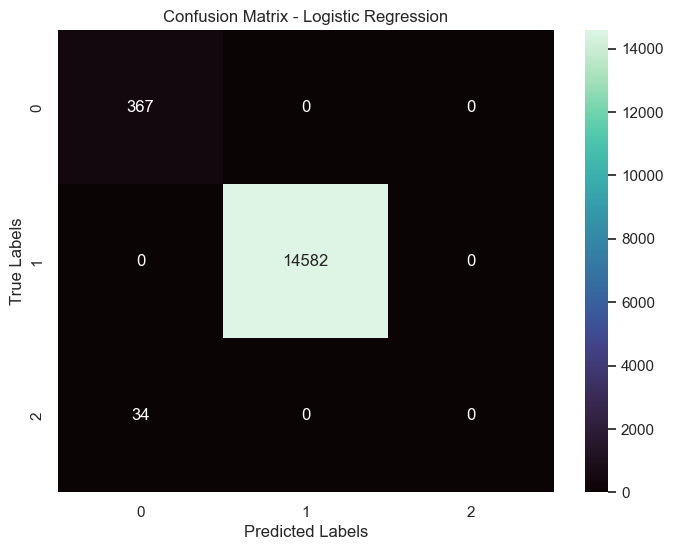


Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.00      0.00      0.00        34

    accuracy                           1.00     14983
   macro avg       0.64      0.67      0.65     14983
weighted avg       1.00      1.00      1.00     14983



C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Random Forest
Accuracy: 0.9977307615297337
Precision: 0.6384039900249376
Recall: 0.6666666666666666
F1 Score: 0.6519097222222222


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



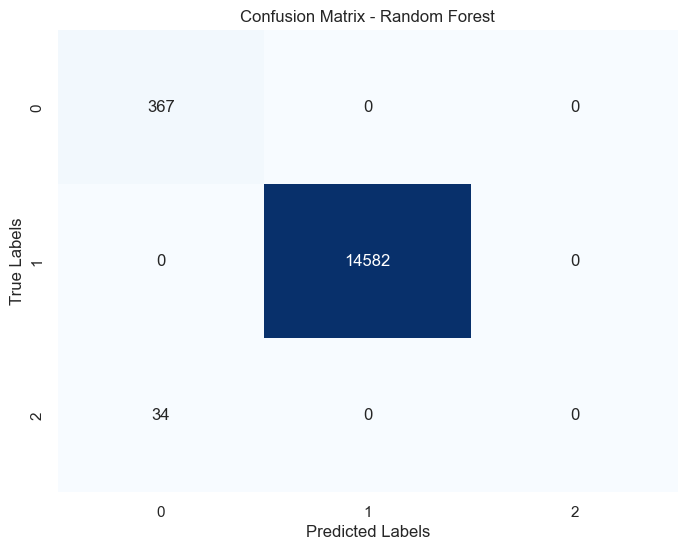

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.00      0.00      0.00        34

    accuracy                           1.00     14983
   macro avg       0.64      0.67      0.65     14983
weighted avg       1.00      1.00      1.00     14983

Decision Tree
Accuracy: 0.9977307615297337
Precision: 0.8064651553316541
Recall: 0.6844579793770369
F1 Score: 0.6869201800312298


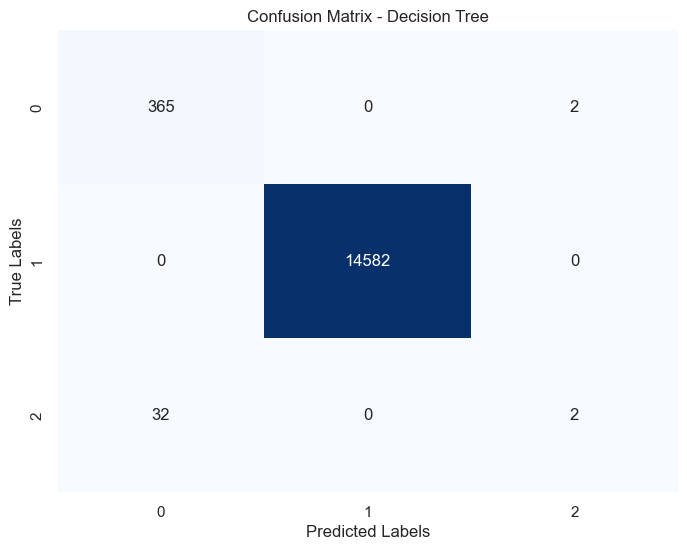

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.50      0.06      0.11        34

    accuracy                           1.00     14983
   macro avg       0.81      0.68      0.69     14983
weighted avg       1.00      1.00      1.00     14983

Best Hyperparameters: {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'uniform'}
KNN
Test Set Accuracy: 0.9976640192217847
Precision: 0.7832970751752478
Recall: 0.6924453705187797
F1 Score: 0.700116449259105


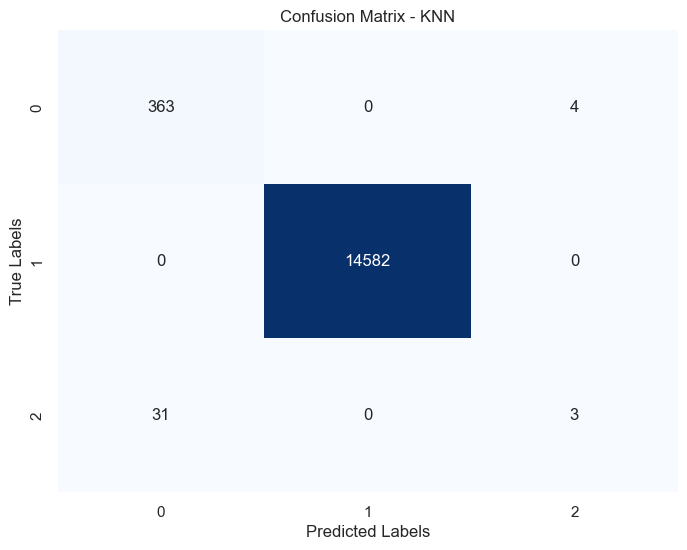

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       367
           1       1.00      1.00      1.00     14582
           2       0.43      0.09      0.15        34

    accuracy                           1.00     14983
   macro avg       0.78      0.69      0.70     14983
weighted avg       1.00      1.00      1.00     14983

Best Hyperparameters: {'C': 0.27425083650459836, 'degree': 3, 'gamma': 0.26685430556951095, 'kernel': 'rbf'}
SVM
Accuracy: 0.9977307615297337
Precision: 0.6384039900249376
Recall: 0.6666666666666666
F1 Score: 0.6519097222222222


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



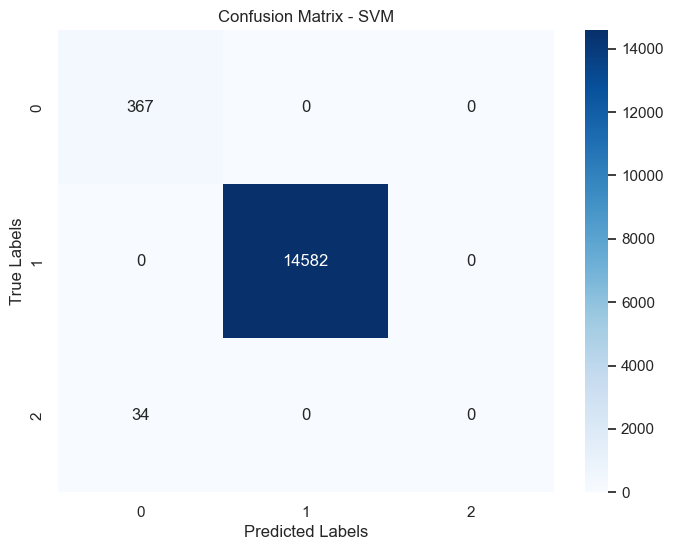


Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.00      0.00      0.00        34

    accuracy                           1.00     14983
   macro avg       0.64      0.67      0.65     14983
weighted avg       1.00      1.00      1.00     14983

Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



XGBoost
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.6}
Accuracy: 0.9977307615297337
Precision: 0.8057644110275689
Recall: 0.6755623230218517
F1 Score: 0.6703897108596847


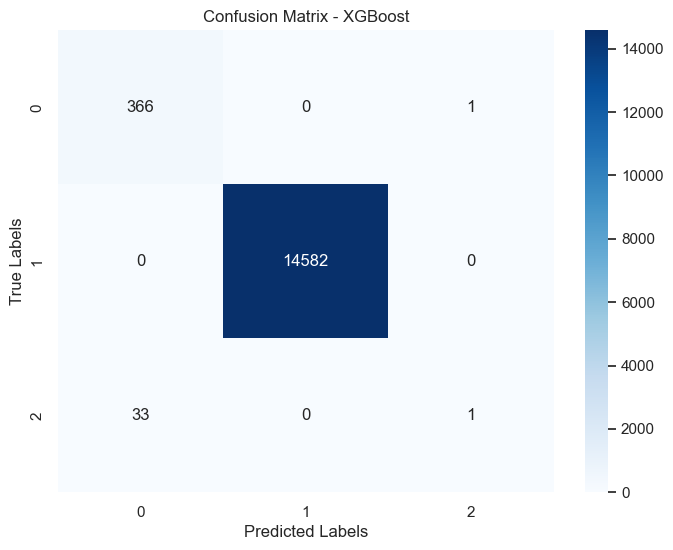


Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.50      0.03      0.06        34

    accuracy                           1.00     14983
   macro avg       0.81      0.68      0.67     14983
weighted avg       1.00      1.00      1.00     14983



C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight

Best Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 50}


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



AdaBoost
Accuracy: 0.9977307615297337
Precision: 0.6384039900249376
Recall: 0.6666666666666666
F1 Score: 0.6519097222222222


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



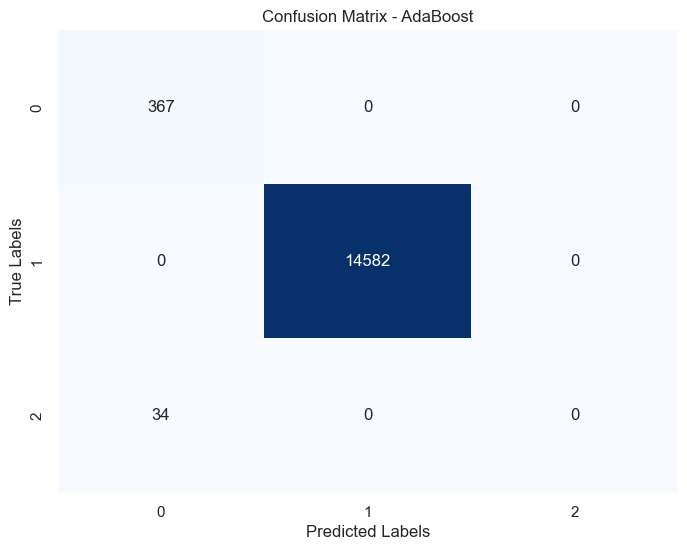

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.00      0.00      0.00        34

    accuracy                           1.00     14983
   macro avg       0.64      0.67      0.65     14983
weighted avg       1.00      1.00      1.00     14983

Voting Classifier
Accuracy: 0.9977307615297337
Precision: 0.6384039900249376
Recall: 0.6666666666666666
F1 Score: 0.6519097222222222


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



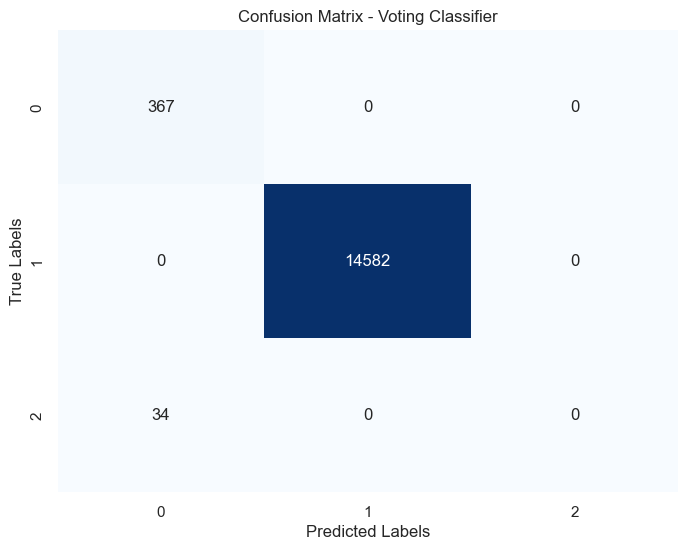

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.00      0.00      0.00        34

    accuracy                           1.00     14983
   macro avg       0.64      0.67      0.65     14983
weighted avg       1.00      1.00      1.00     14983

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}
Gradient Boosting
Accuracy: 0.9977307615297337
Precision: 0.6384039900249376
Recall: 0.6666666666666666
F1 Score: 0.6519097222222222


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



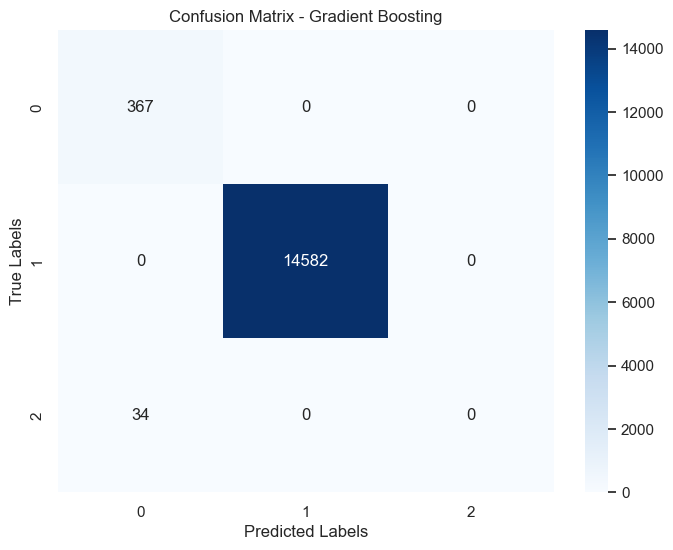


Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       367
           1       1.00      1.00      1.00     14582
           2       0.00      0.00      0.00        34

    accuracy                           1.00     14983
   macro avg       0.64      0.67      0.65     14983
weighted avg       1.00      1.00      1.00     14983

No Handling imbalanced classes Results:
         Name of Model  Accuracy  Precision    Recall  F1 Score
2        Decision Tree  0.997731   0.806465  0.684458  0.686920
5              XGBoost  0.997731   0.805764  0.675562  0.670390
3                  KNN  0.997664   0.783297  0.692445  0.700116
0  Logistic Regression  0.997731   0.638404  0.666667  0.651910
1        Random Forest  0.997731   0.638404  0.666667  0.651910
4                  SVM  0.997731   0.638404  0.666667  0.651910
6             adaboost  0.997731   0.638404  0.666667  0.651910
7    Voting Classifier  0.997731   0.638404

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [97]:
models_results_no_handling = []
X_train_resampled=X_train
y_train_resampled=y_train
y_train_resampled = y_train_resampled.values.ravel()

models_results_no_handling.append(logistic_regression(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(random_forest(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(decision_tree(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(knn(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(svm(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(xgboost(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(adaboost(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(voting_classifier(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_no_handling.append(gradient_boosting(X_train_resampled, y_train_resampled, X_test, y_test))



comparison_table_smote = GetTable(models_results_no_handling)
print("No Handling imbalanced classes Results:")
print(comparison_table_smote)


best_model = FindBestModel(models_results_no_handling)
print("Best Model without handling imbalanced classes:", best_model)

# Models with SMOTE

SMOTE Resampling:
Employment Status
0                    33991
1                    33991
2                    33991
dtype: int64
Mean Cross-Validated MSE: 0.825493005732642
Logistic Regression
Accuracy: 0.9899219114996997
Precision: 0.6843769765970905
Recall: 0.7205214510872469
F1 Score: 0.6489949712331348


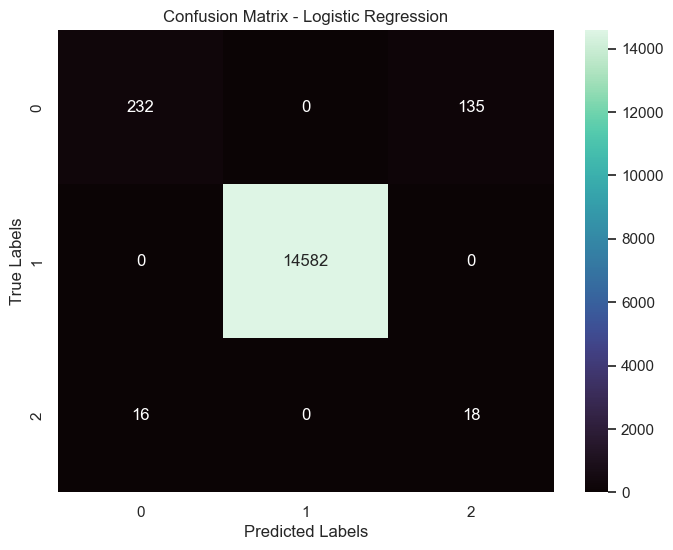


Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.63      0.75       367
           1       1.00      1.00      1.00     14582
           2       0.12      0.53      0.19        34

    accuracy                           0.99     14983
   macro avg       0.68      0.72      0.65     14983
weighted avg       1.00      0.99      0.99     14983

Random Forest
Accuracy: 0.9968631115263966
Precision: 0.7038429406850458
Recall: 0.690441844312657
F1 Score: 0.6941787351425907


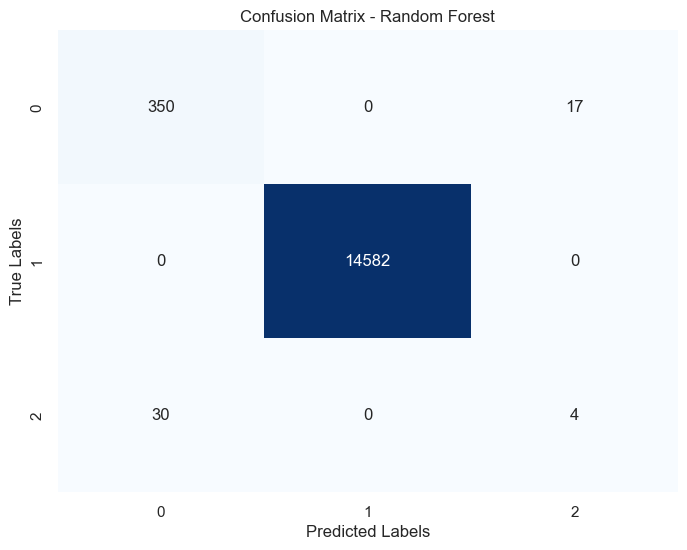

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.95      0.94       367
           1       1.00      1.00      1.00     14582
           2       0.19      0.12      0.15        34

    accuracy                           1.00     14983
   macro avg       0.70      0.69      0.69     14983
weighted avg       1.00      1.00      1.00     14983

Decision Tree
Accuracy: 0.9957284922912635
Precision: 0.681555863342567
Recall: 0.6838969920393225
F1 Score: 0.6824076824076823


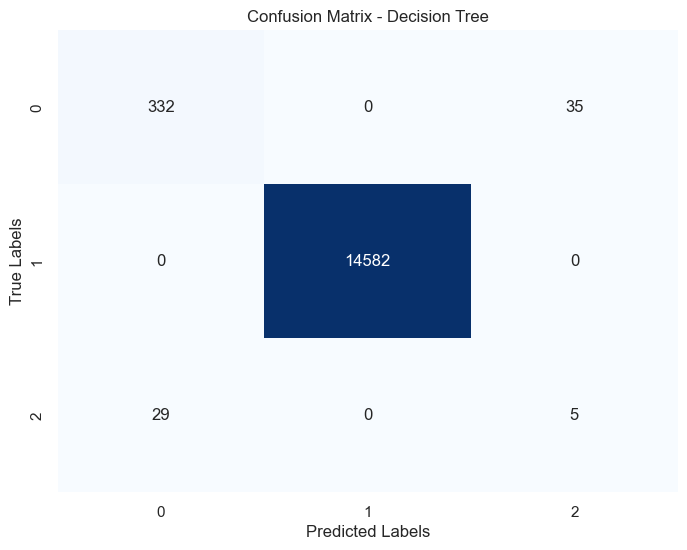

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       367
           1       1.00      1.00      1.00     14582
           2       0.12      0.15      0.14        34

    accuracy                           1.00     14983
   macro avg       0.68      0.68      0.68     14983
weighted avg       1.00      1.00      1.00     14983

Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
KNN
Test Set Accuracy: 0.9951945538276714
Precision: 0.7008143158741329
Recall: 0.7211091521077094
F1 Score: 0.7053276178812004


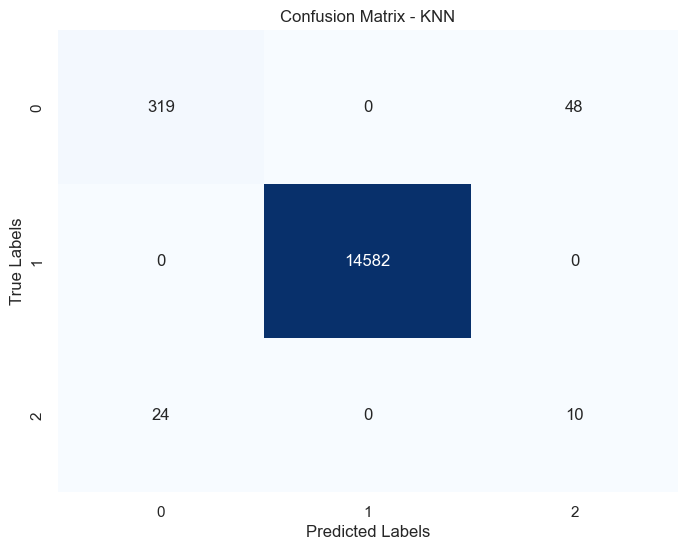

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       367
           1       1.00      1.00      1.00     14582
           2       0.17      0.29      0.22        34

    accuracy                           1.00     14983
   macro avg       0.70      0.72      0.71     14983
weighted avg       1.00      1.00      1.00     14983

SMOTE Results:
         Name of Model  Accuracy  Precision    Recall  F1 Score
1        Random Forest  0.996863   0.703843  0.690442  0.694179
3                  KNN  0.995195   0.700814  0.721109  0.705328
0  Logistic Regression  0.989922   0.684377  0.720521  0.648995
2        Decision Tree  0.995728   0.681556  0.683897  0.682408
Best Model for SMOTE: ('Random Forest', 0.9968631115263966, 0.7038429406850458, 0.690441844312657, 0.6941787351425907)


In [98]:
X_train_resampled, y_train_resampled = apply_smote(X_train, y_train)

models_results_smote = []


models_results_smote.append(logistic_regression(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_smote.append(random_forest(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_smote.append(decision_tree(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_smote.append(knn(X_train_resampled, y_train_resampled, X_test, y_test))



comparison_table_smote = GetTable(models_results_smote)
print("SMOTE Results:")
print(comparison_table_smote)


best_model_smote = FindBestModel(models_results_smote)
print("Best Model for SMOTE:", best_model_smote)

### Best model with smote is Random Forest with precision of 0.7038 and F1 Score of 0.694

# Models with ADASYN

ADASYN Resampling:
Employment Status
0                    34049
1                    33991
2                    33978
dtype: int64
Mean Cross-Validated MSE: 0.6751161536713329
Logistic Regression
Accuracy: 0.9916572115063739
Precision: 0.6691104898001449
Recall: 0.6729710957952664
F1 Score: 0.6492240941933903


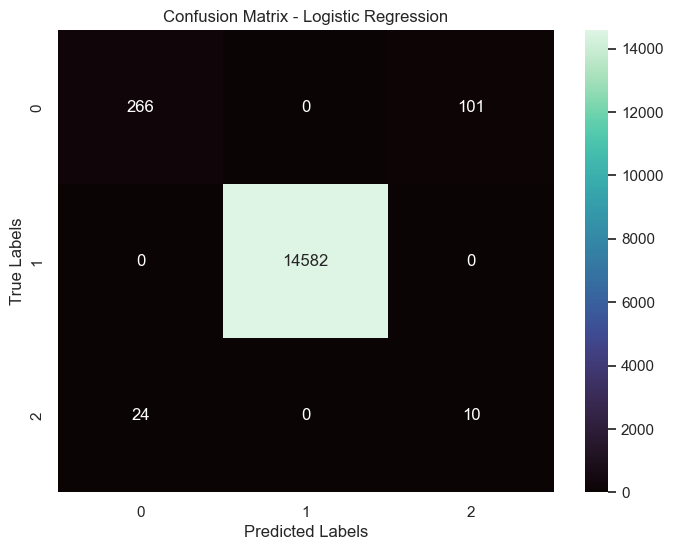


Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.72      0.81       367
           1       1.00      1.00      1.00     14582
           2       0.09      0.29      0.14        34

    accuracy                           0.99     14983
   macro avg       0.67      0.67      0.65     14983
weighted avg       1.00      0.99      0.99     14983

Random Forest
Accuracy: 0.9966628846025496
Precision: 0.704991452991453
Recall: 0.696612705027515
F1 Score: 0.699760407307577


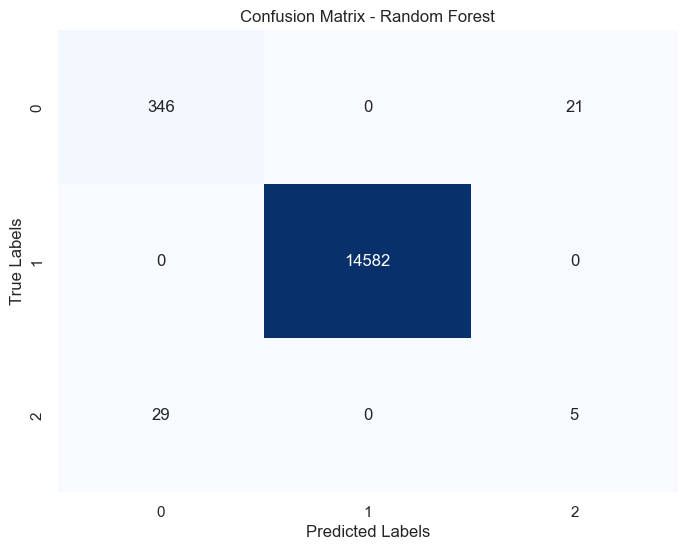

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       367
           1       1.00      1.00      1.00     14582
           2       0.19      0.15      0.17        34

    accuracy                           1.00     14983
   macro avg       0.70      0.70      0.70     14983
weighted avg       1.00      1.00      1.00     14983

Decision Tree
Accuracy: 0.9947940999799773
Precision: 0.6696730351869641
Recall: 0.67118127905113
F1 Score: 0.6681308887191241


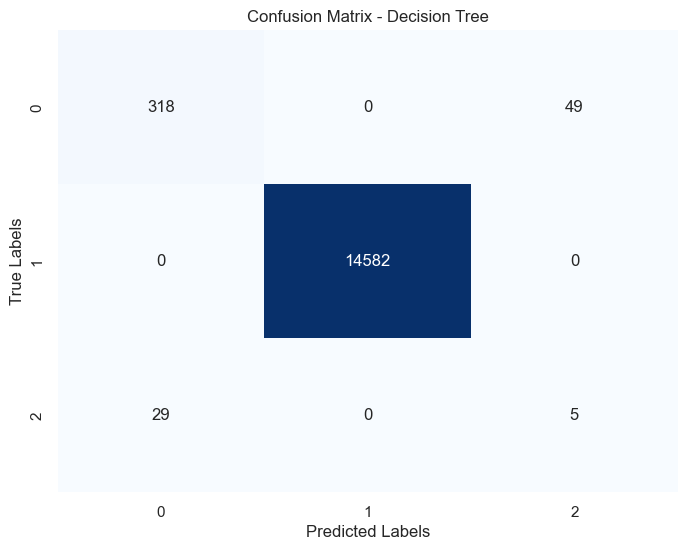

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.87      0.89       367
           1       1.00      1.00      1.00     14582
           2       0.09      0.15      0.11        34

    accuracy                           0.99     14983
   macro avg       0.67      0.67      0.67     14983
weighted avg       1.00      0.99      1.00     14983

Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
KNN
Test Set Accuracy: 0.9951278115197224
Precision: 0.6997720289424126
Recall: 0.7202008868942672
F1 Score: 0.7040306150820732


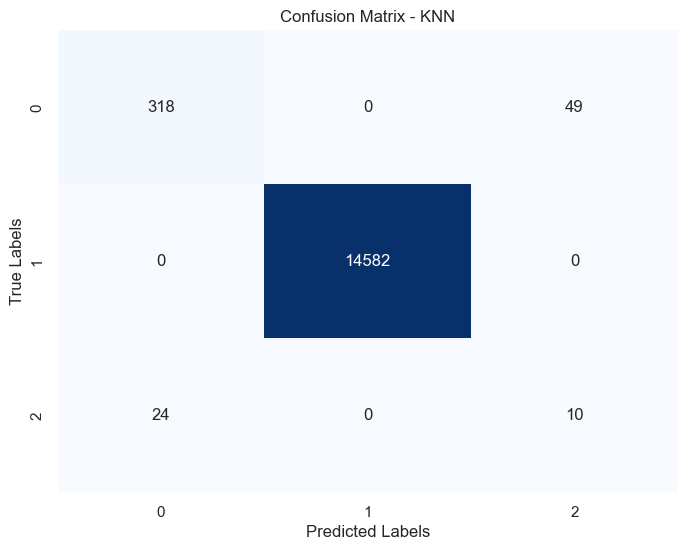

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       367
           1       1.00      1.00      1.00     14582
           2       0.17      0.29      0.22        34

    accuracy                           1.00     14983
   macro avg       0.70      0.72      0.70     14983
weighted avg       1.00      1.00      1.00     14983

ADASYN Results:
         Name of Model  Accuracy  Precision    Recall  F1 Score
1        Random Forest  0.996663   0.704991  0.696613  0.699760
3                  KNN  0.995128   0.699772  0.720201  0.704031
2        Decision Tree  0.994794   0.669673  0.671181  0.668131
0  Logistic Regression  0.991657   0.669110  0.672971  0.649224
Best Model for ADASYN: ('Random Forest', 0.9966628846025496, 0.704991452991453, 0.696612705027515, 0.699760407307577)


In [99]:
X_train_resampled, y_train_resampled = apply_adasyn(X_train, y_train)

models_results_adasyn = []

models_results_adasyn.append(logistic_regression(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_adasyn.append(random_forest(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_adasyn.append(decision_tree(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_adasyn.append(knn(X_train_resampled, y_train_resampled, X_test, y_test))

comparison_table_adasyn = GetTable(models_results_adasyn)
print("ADASYN Results:")
print(comparison_table_adasyn)

best_model_adasyn = FindBestModel(models_results_adasyn)
print("Best Model for ADASYN:", best_model_adasyn)

### Best model with ADASYN is Random Forest with precision of 0.7049 and F1 Score of 0.6997

# Models with NearMiss DownSampling

NearMiss Resampling:
Employment Status
0                    71
1                    71
2                    71
dtype: int64
Mean Cross-Validated MSE: 0.8024363233665559
Logistic Regression
Accuracy: 0.9805779883868384
Precision: 0.6697920132272732
Recall: 0.6778106617557751
F1 Score: 0.5229368067054418


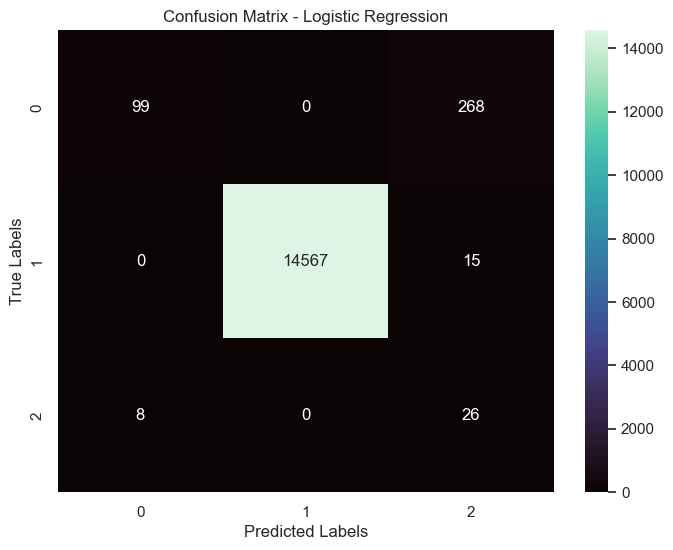


Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.27      0.42       367
           1       1.00      1.00      1.00     14582
           2       0.08      0.76      0.15        34

    accuracy                           0.98     14983
   macro avg       0.67      0.68      0.52     14983
weighted avg       1.00      0.98      0.98     14983

Random Forest
Accuracy: 0.7765467529867183
Precision: 0.6574786746485977
Recall: 0.6250022798778069
F1 Score: 0.3832681945668896


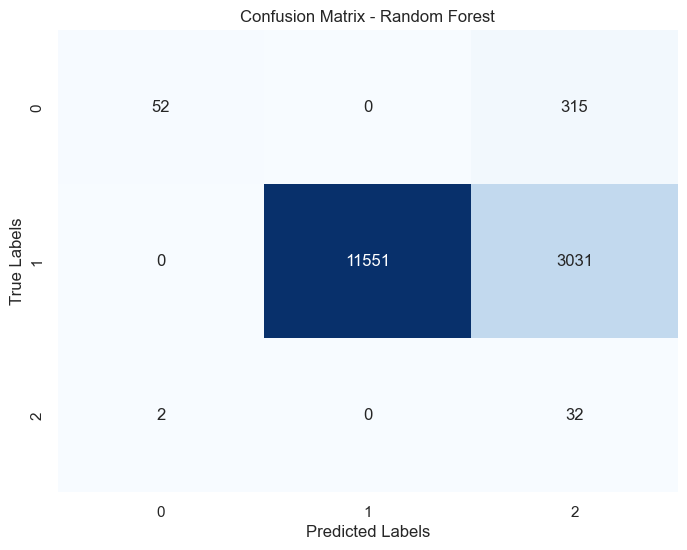

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.14      0.25       367
           1       1.00      0.79      0.88     14582
           2       0.01      0.94      0.02        34

    accuracy                           0.78     14983
   macro avg       0.66      0.63      0.38     14983
weighted avg       1.00      0.78      0.87     14983

Decision Tree
Accuracy: 0.9800440499232463
Precision: 0.6582379721914605
Recall: 0.6483677939840787
F1 Score: 0.4944074418447746


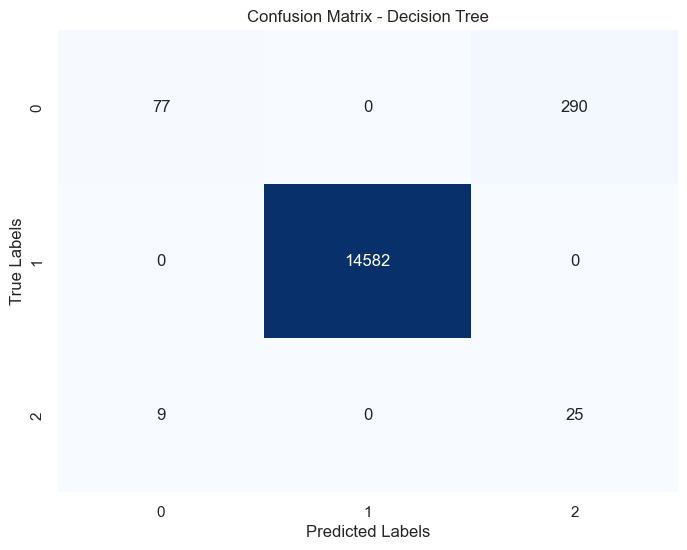

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.21      0.34       367
           1       1.00      1.00      1.00     14582
           2       0.08      0.74      0.14        34

    accuracy                           0.98     14983
   macro avg       0.66      0.65      0.49     14983
weighted avg       1.00      0.98      0.98     14983

Best Hyperparameters: {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'distance'}
KNN
Test Set Accuracy: 0.9829139691650537
Precision: 0.6677047095350317
Recall: 0.6696318854517284
F1 Score: 0.5467726269315674


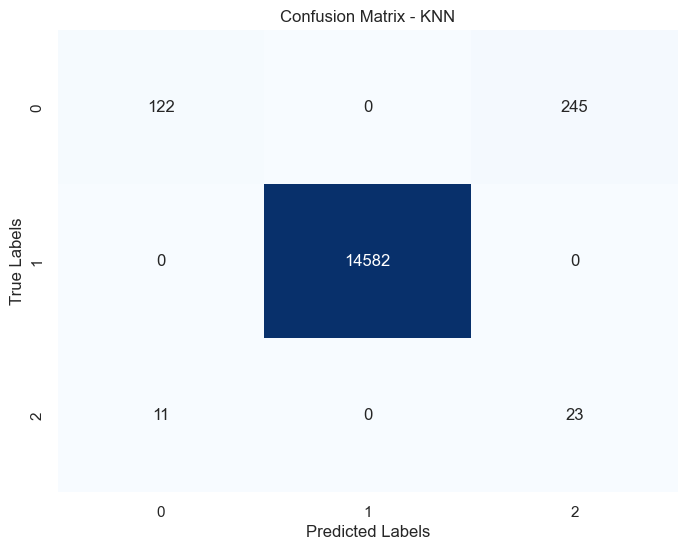

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.33      0.49       367
           1       1.00      1.00      1.00     14582
           2       0.09      0.68      0.15        34

    accuracy                           0.98     14983
   macro avg       0.67      0.67      0.55     14983
weighted avg       1.00      0.98      0.99     14983

Best Hyperparameters: {'C': 2.761259272795352, 'degree': 3, 'gamma': 0.5438850493804799, 'kernel': 'rbf'}
SVM
Accuracy: 0.24941600480544618
Precision: 0.6451843959036287
Recall: 0.44151266508852594
F1 Score: 0.3003927983649871


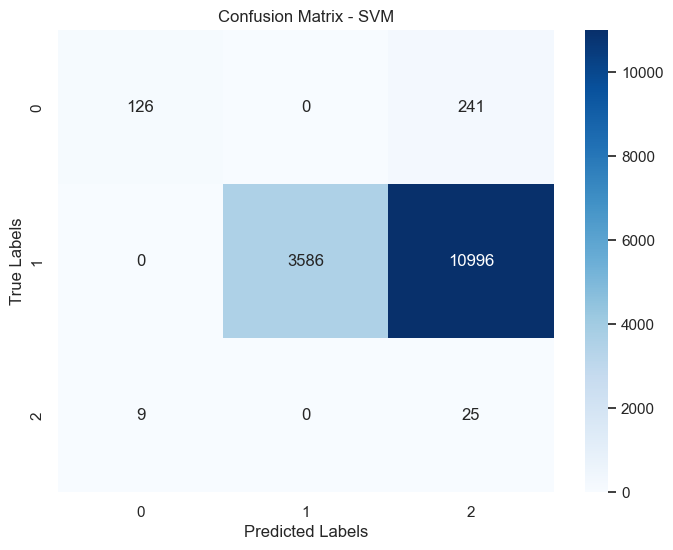


Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.34      0.50       367
           1       1.00      0.25      0.39     14582
           2       0.00      0.74      0.00        34

    accuracy                           0.25     14983
   macro avg       0.65      0.44      0.30     14983
weighted avg       1.00      0.25      0.40     14983

Fitting 5 folds for each of 81 candidates, totalling 405 fits
XGBoost
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
Accuracy: 0.9805779883868384
Precision: 0.6657286243609587
Recall: 0.6645295720468024
F1 Score: 0.5058721901458997


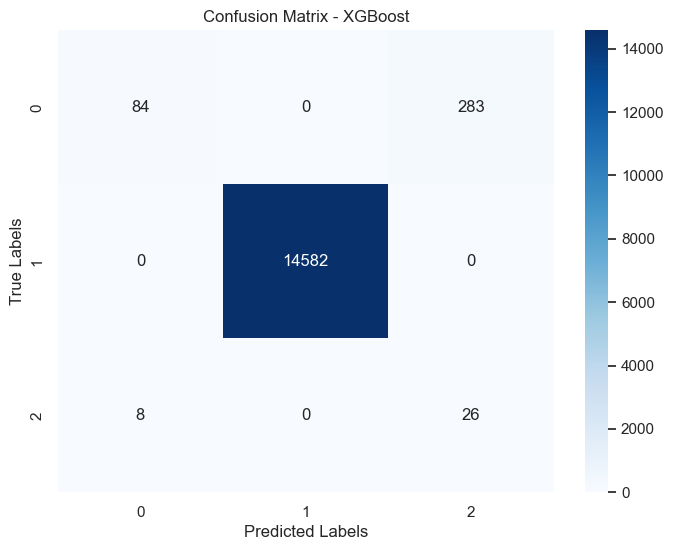


Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.23      0.37       367
           1       1.00      1.00      1.00     14582
           2       0.08      0.76      0.15        34

    accuracy                           0.98     14983
   macro avg       0.67      0.66      0.51     14983
weighted avg       1.00      0.98      0.98     14983



C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight

Best Hyperparameters: {'learning_rate': 0.1, 'n_estimators': 200}


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



AdaBoost
Accuracy: 0.9833811653206967
Precision: 0.6638114281596772
Recall: 0.6581984292354545
F1 Score: 0.5523500178209965


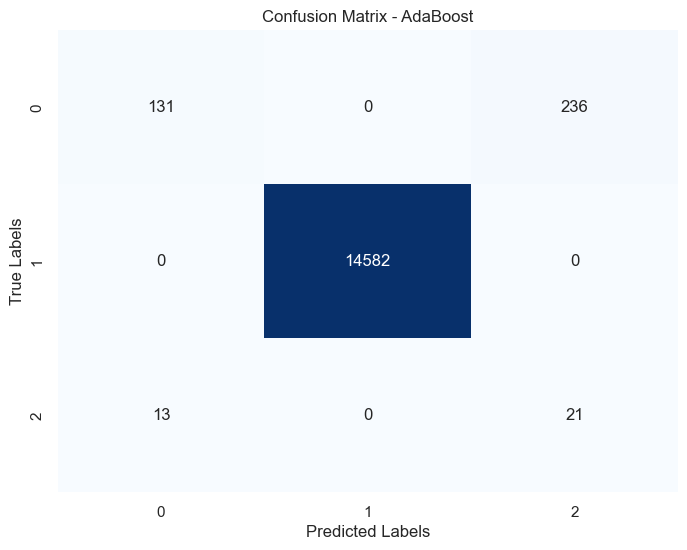

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.36      0.51       367
           1       1.00      1.00      1.00     14582
           2       0.08      0.62      0.14        34

    accuracy                           0.98     14983
   macro avg       0.66      0.66      0.55     14983
weighted avg       1.00      0.98      0.99     14983

Voting Classifier
Accuracy: 0.9674297537208837
Precision: 0.6555766177375976
Recall: 0.6609533057063072
F1 Score: 0.47450000368702905


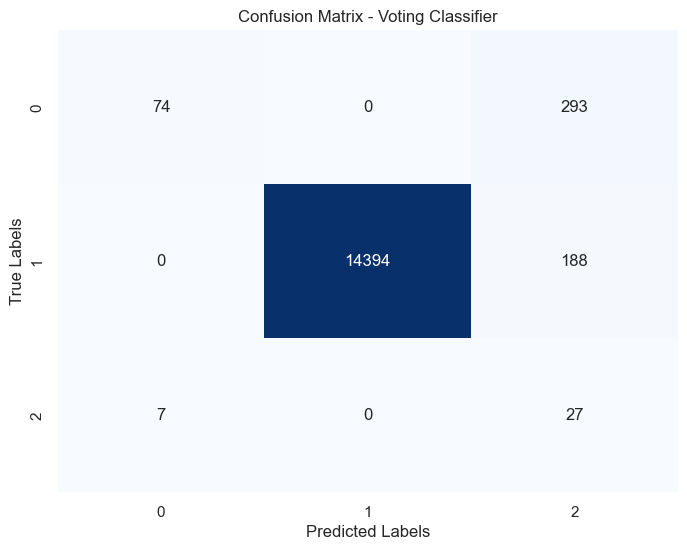

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.20      0.33       367
           1       1.00      0.99      0.99     14582
           2       0.05      0.79      0.10        34

    accuracy                           0.97     14983
   macro avg       0.66      0.66      0.47     14983
weighted avg       1.00      0.97      0.98     14983

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
Gradient Boosting
Accuracy: 0.9801775345391444
Precision: 0.6631721422419096
Recall: 0.6590799807661484
F1 Score: 0.49778933186587976


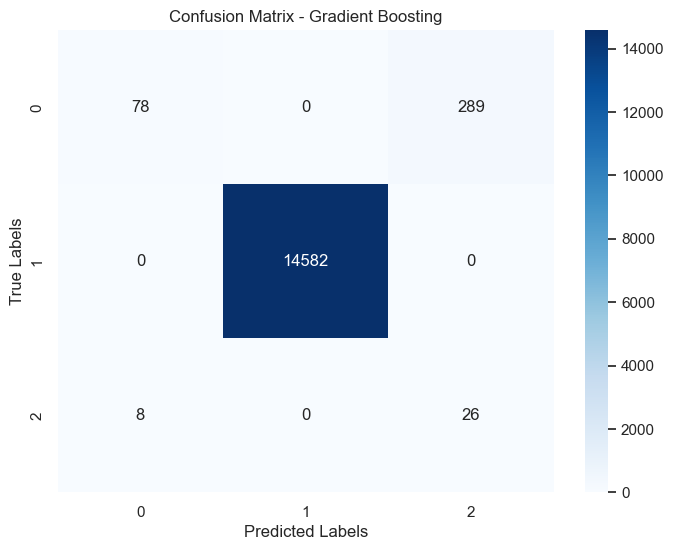


Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.21      0.34       367
           1       1.00      1.00      1.00     14582
           2       0.08      0.76      0.15        34

    accuracy                           0.98     14983
   macro avg       0.66      0.66      0.50     14983
weighted avg       1.00      0.98      0.98     14983

NearMiss Results:
[('Logistic Regression', 0.9805779883868384, 0.6697920132272732, 0.6778106617557751, 0.5229368067054418), ('Random Forest', 0.7765467529867183, 0.6574786746485977, 0.6250022798778069, 0.3832681945668896), ('Decision Tree', 0.9800440499232463, 0.6582379721914605, 0.6483677939840787, 0.4944074418447746), ('KNN', 0.9829139691650537, 0.6677047095350317, 0.6696318854517284, 0.5467726269315674), ('SVM', 0.24941600480544618, 0.6451843959036287, 0.44151266508852594, 0.3003927983649871), ('XGBoost', 0.9805779883868384, 0.6657286243609587, 0.6645295720468024, 0.5058721901458997), 

In [100]:
X_train_resampled, y_train_resampled = apply_nearmiss(X_train, y_train)

models_results_nearmiss = []


models_results_nearmiss.append(logistic_regression(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(random_forest(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(decision_tree(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(knn(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(svm(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(xgboost(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(adaboost(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(voting_classifier(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_nearmiss.append(gradient_boosting(X_train_resampled, y_train_resampled, X_test, y_test))



comparison_table_nearmiss = GetTable(models_results_nearmiss)
print("NearMiss Results:")
print(models_results_nearmiss)


best_model_nearmiss = FindBestModel(models_results_nearmiss)
print("Best Model for NearMiss:", best_model_nearmiss)

### Best model with Near Miss downsampling is Logistic Regression with precision of 0.6697 and F1 Score of 0.5229

# Models with Random Oversampling

Random Oversampling:
Employment Status
0                    33991
1                    33991
2                    33991
dtype: int64
Mean Cross-Validated MSE: 0.8178046925193689
Logistic Regression
Accuracy: 0.9897216845758526
Precision: 0.6861749231650779
Recall: 0.7266923118021049
F1 Score: 0.648485883424408


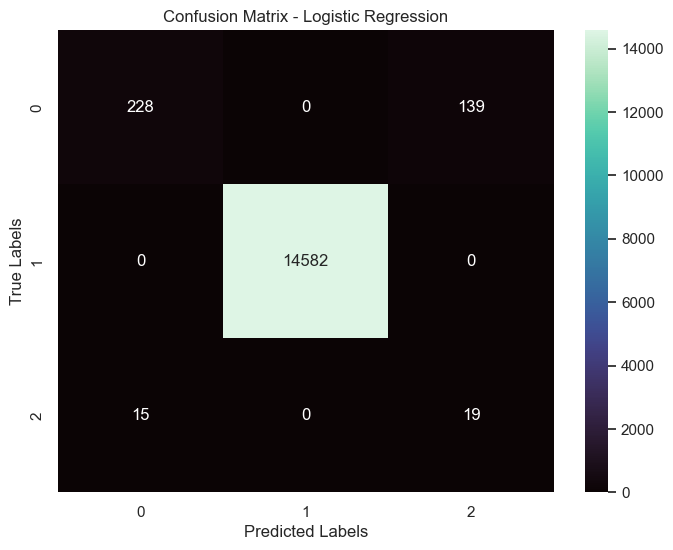


Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.62      0.75       367
           1       1.00      1.00      1.00     14582
           2       0.12      0.56      0.20        34

    accuracy                           0.99     14983
   macro avg       0.69      0.73      0.65     14983
weighted avg       1.00      0.99      0.99     14983

Random Forest
Accuracy: 0.9975972769138357
Precision: 0.765373197625106
Recall: 0.6915371053053375
F1 Score: 0.6984962406015037


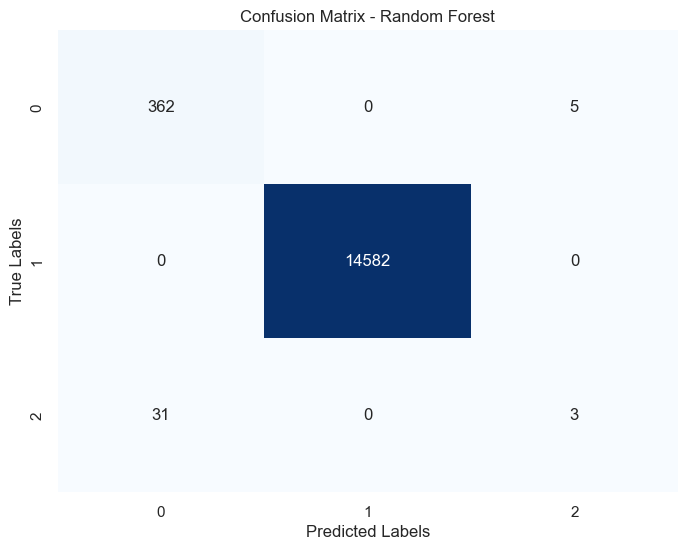

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       367
           1       1.00      1.00      1.00     14582
           2       0.38      0.09      0.14        34

    accuracy                           1.00     14983
   macro avg       0.77      0.69      0.70     14983
weighted avg       1.00      1.00      1.00     14983

Decision Tree
Accuracy: 0.9959954615230595
Precision: 0.7000692520775623
Recall: 0.7053213656034621
F1 Score: 0.7022572022572021


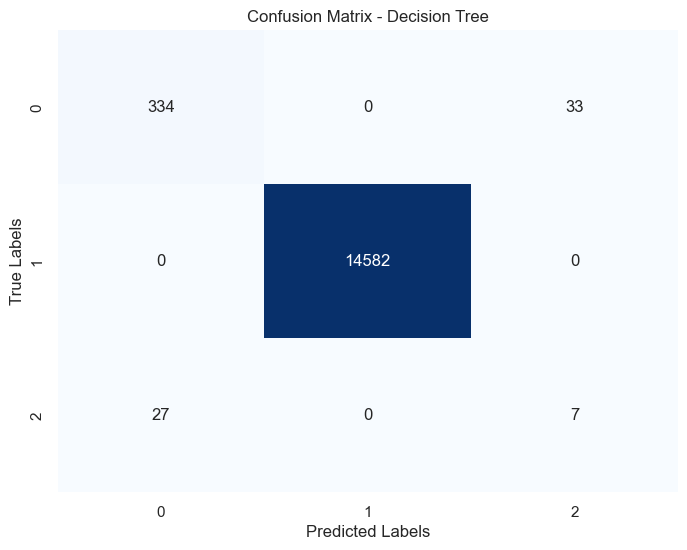

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       367
           1       1.00      1.00      1.00     14582
           2       0.17      0.21      0.19        34

    accuracy                           1.00     14983
   macro avg       0.70      0.71      0.70     14983
weighted avg       1.00      1.00      1.00     14983

Best Hyperparameters: {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
KNN
Test Set Accuracy: 0.9961289461389575
Precision: 0.7032767870088444
Recall: 0.7071378960303467
F1 Score: 0.7049974632166413


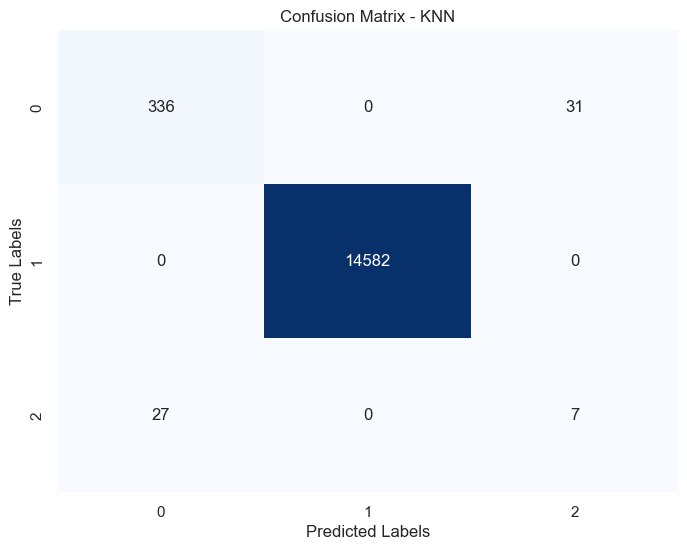

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.92      0.92       367
           1       1.00      1.00      1.00     14582
           2       0.18      0.21      0.19        34

    accuracy                           1.00     14983
   macro avg       0.70      0.71      0.70     14983
weighted avg       1.00      1.00      1.00     14983

Fitting 5 folds for each of 81 candidates, totalling 405 fits
XGBoost
Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150, 'subsample': 0.6}
Accuracy: 0.9971300807581926
Precision: 0.7065630397236616
Recall: 0.6851792488112411
F1 Score: 0.6884480219710727


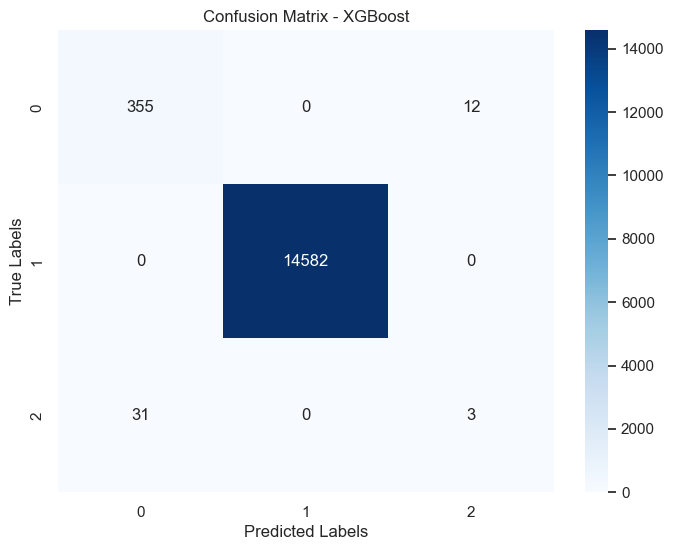


Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94       367
           1       1.00      1.00      1.00     14582
           2       0.20      0.09      0.12        34

    accuracy                           1.00     14983
   macro avg       0.71      0.69      0.69     14983
weighted avg       1.00      1.00      1.00     14983

Random Oversampling Results:
         Name of Model  Accuracy  Precision    Recall  F1 Score
1        Random Forest  0.997597   0.765373  0.691537  0.698496
4              XGBoost  0.997130   0.706563  0.685179  0.688448
3                  KNN  0.996129   0.703277  0.707138  0.704997
2        Decision Tree  0.995995   0.700069  0.705321  0.702257
0  Logistic Regression  0.989722   0.686175  0.726692  0.648486
Best Model for Random Oversampling: ('Random Forest', 0.9975972769138357, 0.765373197625106, 0.6915371053053375, 0.6984962406015037)


In [101]:
X_train_resampled, y_train_resampled = apply_random_oversampling(X_train, y_train)

models_results_oversampling = []


models_results_oversampling.append(logistic_regression(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_oversampling.append(random_forest(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_oversampling.append(decision_tree(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_oversampling.append(knn(X_train_resampled, y_train_resampled, X_test, y_test))
models_results_oversampling.append(xgboost(X_train_resampled, y_train_resampled, X_test, y_test))


comparison_table_oversampling = GetTable(models_results_oversampling)
print("Random Oversampling Results:")
print(comparison_table_oversampling)


best_model_oversampling = FindBestModel(models_results_oversampling)
print("Best Model for Random Oversampling:", best_model_oversampling)

### Best model with Random Over Sampling is Random Forest with precision of 0.76537 and F1 Score with 0.698

# Balanced Random Forest

Balanced Random Forest
Accuracy: 0.9891210038043116
Precision: 0.6887617594711416
Recall: 0.7363092375914944
F1 Score: 0.6439487409949477


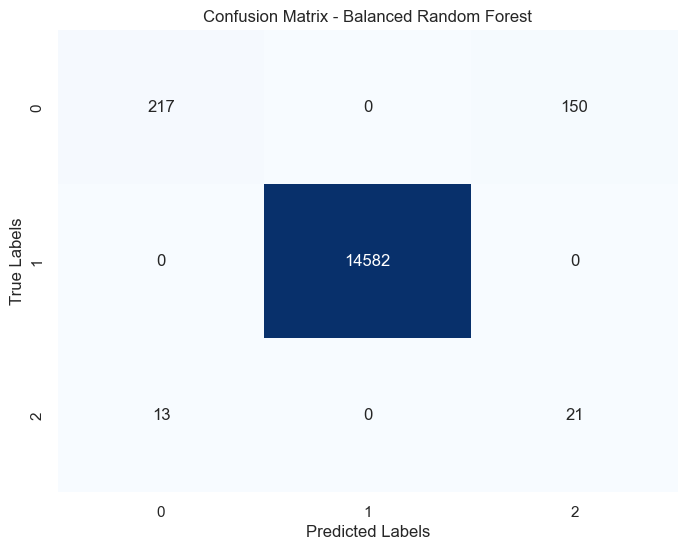

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.59      0.73       367
           1       1.00      1.00      1.00     14582
           2       0.12      0.62      0.20        34

    accuracy                           0.99     14983
   macro avg       0.69      0.74      0.64     14983
weighted avg       1.00      0.99      0.99     14983

Balanced Random Forest Results:
            Name of Model  Accuracy  Precision    Recall  F1 Score
0  Balanced Random Forest  0.989121   0.688762  0.736309  0.643949


In [104]:
models_result = []
X_train_resampled=X_train
y_train_resampled=y_train
y_train_resampled = y_train_resampled.values.ravel()

models_result.append(Balanced_random_forest(X_train_resampled, y_train_resampled, X_test, y_test))

comparison_table = GetTable(models_result)
print("Balanced Random Forest Results:")
print(comparison_table)

### Balanced Random Forest model achieved a precision of 0.688762 and an F1 score of 0.643949

# The best model and technique among all is the *Random Forest* with *Random Oversampling*.

In [105]:
X_train=Saved_X_train
X_test=Saved_X_test
y_train=Saved_y_train
y_test=Saved_y_test

In [112]:
X_train_resampled, y_train_resampled = apply_random_oversampling(X_train, y_train)

Random Oversampling:
Employment Status
0                    33991
1                    33991
2                    33991
dtype: int64


Random Forest
Accuracy: 0.9975972769138357
Precision: 0.765373197625106
Recall: 0.6915371053053375
F1 Score: 0.6984962406015037


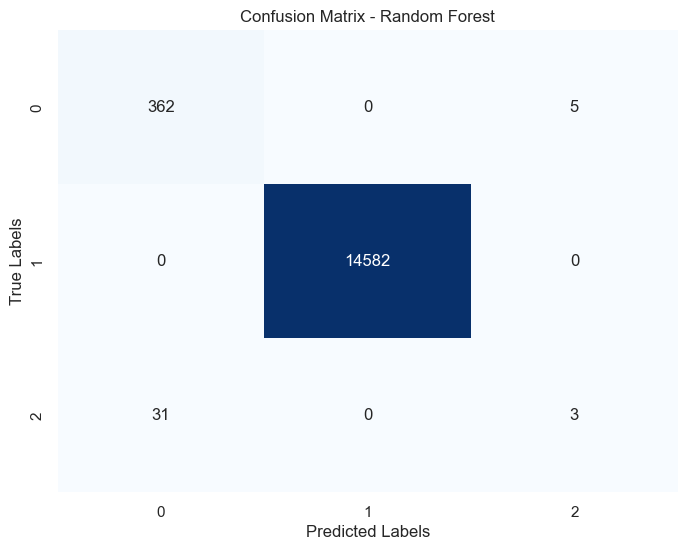

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       367
           1       1.00      1.00      1.00     14582
           2       0.38      0.09      0.14        34

    accuracy                           1.00     14983
   macro avg       0.77      0.69      0.70     14983
weighted avg       1.00      1.00      1.00     14983



In [115]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}


rf_model = RandomForestClassifier(random_state=42)
kf = KFold(n_splits=5, shuffle=True, random_state=42)


grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=kf, scoring='accuracy', verbose=0)
grid_search.fit(X_train_resampled, y_train_resampled)


best_params = grid_search.best_params_
best_score = grid_search.best_score_


rf_best = RandomForestClassifier(**best_params, random_state=42)
rf_best.fit(X_train_resampled, y_train_resampled)


model_path = r"D:\Projects - current\data science freelance project\best_rf_model.pkl" 


with open(model_path, 'wb') as file:
    pickle.dump(rf_best, file)


y_pred = rf_best.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')


print("Random Forest")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.title("Confusion Matrix - Random Forest")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print("Classification Report:")
print(classification_report(y_test, y_pred))

# Summary of Findings
## The top-performing model was identified as the Random Forest, which achieved accuracy of 99.7% and Precision of 0.765.